# <center> Майнор "Интеллектуальный анализ данных" </center>

# <center> Курс "Введение в анализ данных" </center>

# <center> Лабораторная работа №2. Кластерный анализ. </center>

# Часть 1

В данном задании вам необходимо **самостоятельно** реализовать один из алгоритмов кластеризации.  
По аналогии с классами в scikit-learn, нужно реализовать класс, наследуемый от [Base Estimator](https://scikit-learn.org/stable/modules/generated/sklearn.base.BaseEstimator.html).  
Подробнее про реализацию своих моделей в scikit-learn: [here](https://scikit-learn.org/stable/developers/develop.html#rolling-your-own-estimator).  
В классе помимо `__init__()` нужно реализовать два метода:
 - `fit()` - метод, выполняющий кластеризацию данных.
 - `predict()` - метод, определяющий для нового объекта, к какому из кластеров он относится. 
 
Для удобства можно создавать дополнительные методы класса, которые будут вызываться в `fit()` или `predict()`.  <br>
Функции для вычисления расстояний *между объектами* самим реализовывать не нужно, используйте реализации из `scipy`.

# All Imports

In [1]:
import numpy as np
import pandas as pd
from sklearn.base import BaseEstimator, ClusterMixin
from scipy.spatial import distance
from sklearn.metrics import confusion_matrix, classification_report
from sklearn.preprocessing import StandardScaler, LabelEncoder, MinMaxScaler
from sklearn.model_selection import train_test_split
from sklearn.metrics import silhouette_score, davies_bouldin_score, calinski_harabasz_score
from sklearn.cluster import KMeans
from sklearn.cluster import DBSCAN
from sklearn.cluster import MeanShift
from scipy.cluster import hierarchy
from tabulate import tabulate as tb
import itertools
import enum
from sklearn.datasets import load_iris
import matplotlib.pyplot as plt
import seaborn as sns
import time

In [2]:
pd.set_option('display.max_colwidth', None)

In [3]:
import warnings
warnings.filterwarnings('ignore')

# DBSCAN

In [4]:
def get_condensed_distance(pair, condensed_matrix):
    i, j = pair
    size = condensed_matrix.size
    if i == j or not 0 <= i < size or not 0 <= j < size:
        return None
    pair = (i, j) if i <= j else (j, i)
    index = list(itertools.combinations(range(size),2)).index(pair)
    return condensed_matrix[index]

In [5]:
class My_DBSCAN(BaseEstimator, ClusterMixin):
  
    class Obj_State(enum.Enum):
        outlier = -1
        reachable = 0
        core = 1



    def __init__(self, eps=0.5, min_samples=5, metric='euclidean',  metric_params=None):
        """
        Инициализация DBSCAN
        """
        self.eps = eps #neighborhood range
        self.min_samples = min_samples#core object definition condition
        self.metric = metric# distance metric, or callable
        self.metric_params = metric_params if metric_params else {} #additional params for metrics

        self.labels_ = None
        self.core_sample_coords_ = None
        self.core_sample_indices_ = None
        self._objects_states_ = None



    def _define_clusters(self, objects_states: list, neighbours: list):
        """
        Определение кластеров на основе состояний объектов:core, reachable, outlier
        """
        size = len(objects_states)
        new_labels = np.full(size, -1, dtype=int)
        cur_label = 0
        for object_i in range(size):
            if ((new_labels[object_i] != -1) or (objects_states[object_i] is not self.Obj_State.core)):
                continue
            stack = list()
            depth_i = object_i
            # depth search связанных объектов
            while True:
                if new_labels[depth_i] == -1:
                    new_labels[depth_i] = cur_label
                    if objects_states[depth_i] is self.Obj_State.core:
                        for neighbour in neighbours[depth_i]:
                            if new_labels[neighbour] == -1:
                                stack.append(neighbour)
                if not len(stack):
                    break
                else:
                    depth_i = stack.pop()
            cur_label += 1

        return new_labels

    @staticmethod
    def _find_neighbours(X, eps, num_of_objects):
        """
        Нахождение всех соседей для объектов
            X:матрица расстояний
            eps: максимальное расстояние для определения соседа
            objects_num: количество объектов
        возвращает вложенный список, в котором перечислены все соседи объектов (индексы)
        """
        neighbours = [[] for i in range(num_of_objects)]
        for couple, dist in zip(itertools.combinations(range(num_of_objects), 2), X):
            if dist <= eps:
                i, j = couple
                neighbours[j].append(i)
                neighbours[i].append(j)
        return neighbours

    def fit(self, X, y=None):
        """
        Определение кластеров на основе алгоритма DBSCAN
        Возвращает self
        """
        if self.metric == 'precomputed':
            distance_matrix = distance.squareform(X)
        else:
            distance_matrix = distance.pdist(X=X, metric=self.metric, **self.metric_params)
        size = X.shape[0]
        neighbours = self._find_neighbours(distance_matrix, self.eps, size)
        self._objects_states_ = [self.Obj_State.outlier] * size
        self.core_sample_coords_ = []
        self.core_sample_indices_ = []
        # define core objects
        for object_i in range(size):
            if len(neighbours[object_i]) + 1 >= self.min_samples:
                self._objects_states_[object_i] = self.Obj_State.core
                if self.metric != 'precomputed':
                    self.core_sample_coords_.append(X[object_i])
                    self.core_sample_indices_.append(object_i)
        # define reachable objects
        for object_i in range(size):
            if self._objects_states_[object_i] is self.Obj_State.core:
                continue
            for neighbour in neighbours[object_i]:
                if self._objects_states_[neighbour] is self.Obj_State.core:
                    self._objects_states_[object_i] = self.Obj_State.reachable
                    break
        # define clusters
        self.labels_ = self._define_clusters(self._objects_states_, neighbours)
        return self

    def fit_predict(self, X, y=None):
        """
       Определение кластеров на основе алгоритма DBSCAN и возвращаемых меток
       Возвращает метки определенных кластеров
        """
        self.fit(X)
        return self.labels_

    def predict(self, X):
        """
        X: np.array(shape=(samples, features)) объектов для прогнозирования кластера
        Возвращает метки для каждого объекта 
        """
        if self.metric == 'precomputed':
            raise RuntimeError("DBSAN has been initialized with precomputed distance matrix. Cannot predict")
        if self.labels_ is None:
            raise RuntimeError("DBSAN must be fitted to predict")
        size = X.shape[0]
        dist_matrix = distance.cdist(X, self.core_sample_coords_)
        new_labels_ = np.full(size, -1, dtype=int)
        for object_i in range(size):
            unique_labels = set(self.labels_) - {-1}
            cluster_candidates = {label: 0 for label in unique_labels}
            for core_i in range(len(self.core_sample_coords_)):
                if dist_matrix[object_i][core_i] <= self.eps:
                    cur_label = self.labels_[self.core_sample_indices_[core_i]]
                    cluster_candidates[cur_label] += 1
            better_cluster, cluster_score = sorted(cluster_candidates.items(), key=lambda x: x[1])[-1]
            if cluster_score != 0:
                new_labels_[object_i] = better_cluster
        return new_labels_

    def get_params(self, deep=True):
        return {
            "eps": self.eps,
            "min_samples": self.min_samples,
            "metric": self.metric,
            "metric_params": self.metric_params
        }

    def set_params(self, **params):
        for parameter, value in params.items():
            setattr(self, parameter, value)

### Вариант №2

Алгоритм Dbscan.  
  
Параметры: 
- **eps:** радиус окрестности $\varepsilon$;  
- **min_samples:** минимальное число объектов в окрестности $\varepsilon$ для основных точек;  
- **metric:** функция расстояния между объектами. Должны поддерживаться метрики из `scipy.spatial.distance`, самописные функции (callable) и предрассчитанная матрица расстояний.   
- **metric_params:** параметры функции расстояния, если такие есть. 
  
Атрибуты:  
- **core\_sample\_coords\_:** - векторы основных точек;
- **labels_:** метки кластеров для каждого объекта.
  
Метод `predict()`:  Для нового объекта вычисляется число основных точек из каждого кластера, попавших в окрестность $\varepsilon$. Объект определяется в кластер с наибольшим числом таких точек.  
**Note:** Метод `predict()` не выполняется в случае, когда **metric** - это матрица расстояний. 

### Тестирование 

Вашу реализацию необходимо сравнить с питоновской реализацией алгоритма из `sklearn` или `scipy`. Результаты кластеризации должны совпадать.  
Также необходимо сравнить скорость работы вашей реализации и питоновской (это нормально, если ваша реализация будет медленнее).  
Сравнение необходимо выполнить на наборе данных iris.

In [6]:
iris = load_iris()
X = iris.data  # использовать для кластеризации
y = iris.target # истинные метки цветков

In [7]:
y

array([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2,
       2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2,
       2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2])

In [8]:
X_1 = pd.DataFrame(X, columns=iris.feature_names)
X_1['class'] = [iris.target_names[i] for i in y]

In [9]:
X_1

,sepal length (cm),sepal width (cm),petal length (cm),petal width (cm),class
0,5.1,3.5,1.4,0.2,setosa
1,4.9,3.0,1.4,0.2,setosa
2,4.7,3.2,1.3,0.2,setosa
3,4.6,3.1,1.5,0.2,setosa
4,5.0,3.6,1.4,0.2,setosa
...,...,...,...,...,...
145,6.7,3.0,5.2,2.3,virginica
146,6.3,2.5,5.0,1.9,virginica
147,6.5,3.0,5.2,2.0,virginica
148,6.2,3.4,5.4,2.3,virginica


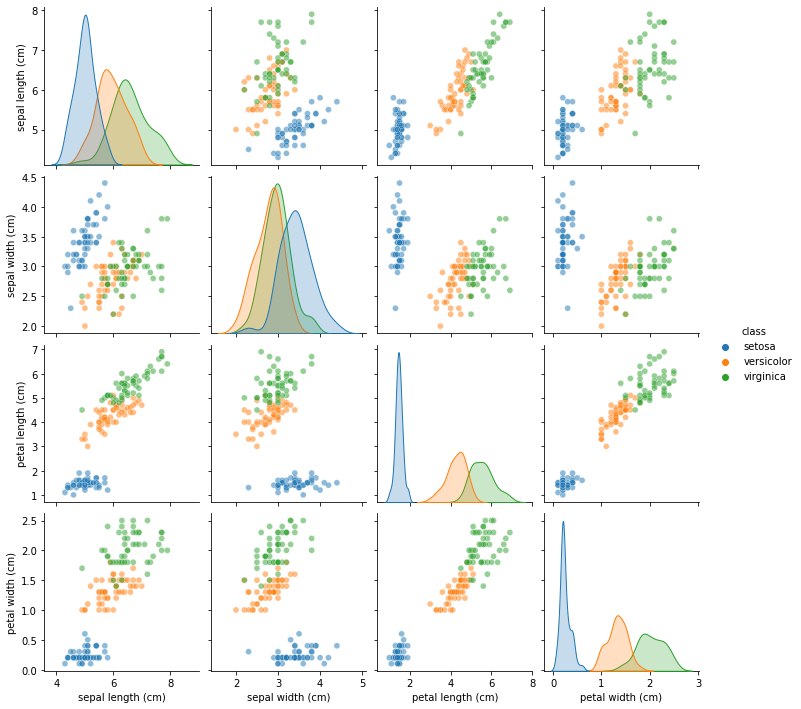

In [10]:
sns.pairplot(X_1, hue='class', plot_kws={'alpha':0.5}, vars=iris.feature_names)
plt.show()

Масштабирование набора данных

In [11]:
sc = StandardScaler()
X = sc.fit_transform(X)

In [12]:
scaled_data = pd.DataFrame()
for label, i in zip(iris.feature_names, range(len(iris.feature_names))):
    scaled_data[label] = X[:, i]
scaled_data['class'] = X_1['class']

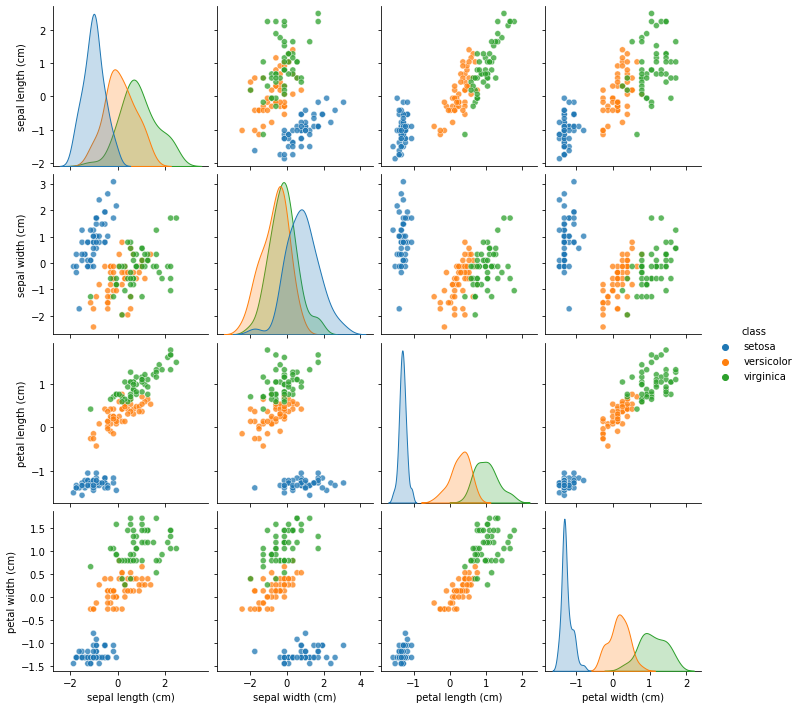

In [13]:
sns.pairplot(scaled_data, hue='class', plot_kws={'alpha': 0.75}, vars=iris.feature_names)
plt.show()

####  Моя реализация DBSCAN

In [14]:
time_start = time.time()

my_clustering = My_DBSCAN(eps=0.7, min_samples=5)
my_clustering.fit(X)

time_end = time.time()
my_time = time_end - time_start
print("Время выполнения:", my_time)
my_clustering.labels_

Время выполнения: 0.0032196044921875


array([ 0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0, -1,  0,
        0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,
        0,  0,  0,  0,  0,  0,  0, -1,  0,  0,  0,  0,  0,  0,  0,  0,  1,
        1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,
        1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,
        1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,
        1,  1,  1,  1, -1,  1,  1, -1,  1,  1,  1,  1,  1,  1,  1, -1,  1,
        1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1, -1,  1,  1,  1,  1,
        1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1])

In [15]:
len(my_clustering.core_sample_coords_)

127

#### Sci-kit learn DBSCAN 

In [16]:
time_start = time.time()

clustering = DBSCAN(eps=0.7, min_samples=5).fit(X)

time_end = time.time()
sk_time = time_end - time_start
print("Время выполнения:", sk_time)
clustering.labels_

Время выполнения: 0.004895448684692383


array([ 0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0, -1,  0,
        0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,
        0,  0,  0,  0,  0,  0,  0, -1,  0,  0,  0,  0,  0,  0,  0,  0,  1,
        1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,
        1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,
        1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,
        1,  1,  1,  1, -1,  1,  1, -1,  1,  1,  1,  1,  1,  1,  1, -1,  1,
        1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1, -1,  1,  1,  1,  1,
        1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1])

In [17]:
len(clustering.core_sample_indices_)

127

#### Проверка различий между кластаризациями 

In [18]:
def find_differences(list1: list, list2: list):
    count = 0
    indexes = []
    size = min(len(list1), len(list2))
    for i in range(size):
        if list1[i] != list2[i]:
            count += 1
            indexes.append(i)
    added_indexes = []
    if len(list1)!= len(list2):
        count += abs(len(list1) - len(list2))
        added_indexes = list(range(size, max(len(list1) - len(list2))))
    indexes += added_indexes
    return count, indexes

In [19]:
find_differences(my_clustering.labels_, clustering.labels_)

(0, [])

**Result**: нет различий в выходах алгоритмов

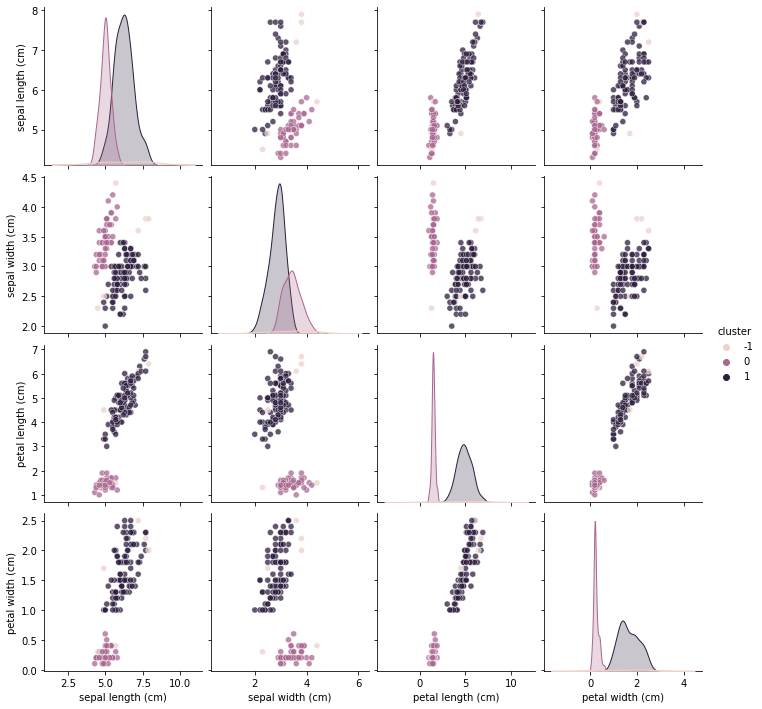

In [20]:
X_1['cluster'] = my_clustering.labels_
sns.pairplot(X_1.drop('class', axis=1), hue='cluster', plot_kws={'alpha': 0.75}, vars=iris.feature_names)
plt.show()

Predict

In [21]:
prediction = my_clustering.predict(X)
prediction

array([ 0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0, -1,  0,
        0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,
        0,  0,  0,  0,  0,  0,  0, -1,  0,  0,  0,  0,  0,  0,  0,  0,  1,
        1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,
        1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,
        1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,
        1,  1,  1,  1, -1,  1,  1, -1,  1,  1,  1,  1,  1,  1,  1, -1,  1,
        1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1, -1,  1,  1,  1,  1,
        1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1])

In [22]:
find_differences(my_clustering.labels_, prediction)

(0, [])

In [23]:
print('Время выполнения')
print(tb({'My_DBSCAN': my_time, 'Sci-Kit learn': sk_time}.items()))
print('Dif:', sk_time - my_time)

Время выполнения
-------------  ----------
My_DBSCAN      0.0032196
Sci-Kit learn  0.00489545
-------------  ----------
Dif: 0.0016758441925048828


### Небольшое подведение итогов:
* DBSCAN не может правильно определить 3 исходных класса, потому что "virginica" и "versicolor" очень близки друг к другу и имеют пересечения почти по всем признакам.
* Моя реализация дает такой же ответ что и реализация Sci-Kit Learn, может делать это примерно за такое же время(при данном запуске вообще быстрее сделала:))

# Часть 2

В данном задании вам предлагается проанализировать набор данных по различным городам США. Каждый город характеризуется следующими признаками:

In [24]:
pd.set_option('display.max_colwidth', None)

In [25]:
data_desc = pd.read_csv('Data_Description.txt', sep=':')
data_desc

,jupyter notebookAttribute,Description
0,Place,"City, state (postal code)"
1,Climate & Terrain,"Very hot and very cold months, seasonal temperature variation, heating- and cooling-degree days, freezing days, zero-degree days, ninety-degree days."
2,Housing,"Utility bills, property taxes, mortgage payments."
3,Health Care & Environment,"Per capita physicians, teaching hospitals, medical schools, cardiac rehabilitation centers, comprehensive cancer treatment centers, hospices, insurance/hospitalization costs index, flouridation of drinking water, air pollution."
4,Crime,"Violent crime rate, property crime rate."
5,Transportation,"Daily commute, public transportation, Interstate highways, air service, passenger rail service."
6,Education,"Pupil/teacher ratio in the public K-12 system, effort index in K-12, accademic options in higher education."
7,The Arts,"Museums, fine arts and public radio stations, public television stations, universities offering a degree or degrees in the arts, symphony orchestras, theatres, opera companies, dance companies, public libraries."
8,Recreation,"Good restaurants, public golf courses, certified lanes for tenpin bowling, movie theatres, zoos, aquariums, family theme parks, sanctioned automobile race tracks, pari-mutuel betting attractions, major- and minor- league professional sports teams, NCAA Division I football and basketball teams, miles of ocean or Great Lakes coastline, inland water, national forests, national parks, or national wildlife refuges, Consolidated Metropolitan Statistical Area access."
9,Economics,"Average household income adjusted for taxes and living costs, income growth, job growth."


### Notes:   
* Для всех признаков, кроме трех, чем выше значение - тем лучше. Для признаков `Housing` и `Crime` - наоборот.
* Признак `Population`- статистический признак, не имеющий интерпретации как “лучше-хуже”.
* Признак `Place` - уникальный идентификатор объекта (города), он не должен использоваться при кластеризации.
* Также в данных присутствуют географические координаты городов - `Longitude` и `Latitude`. Их также не следует использовать при кластеризации данных.

In [26]:
data = pd.read_csv('Data.txt', sep=' ')
data

,Place,Climate,HousingCost,HlthCare,Crime,Transp,Educ,Arts,Recreat,Econ,Long,Lat,Pop
0,"Abilene,TX",521,6200,237,923,4031,2757,996,1405,7633,-99.6890,32.5590,110932
1,"Akron,OH",575,8138,1656,886,4883,2438,5564,2632,4350,-81.5180,41.0850,660328
2,"Albany,GA",468,7339,618,970,2531,2560,237,859,5250,-84.1580,31.5750,112402
3,"Albany-Schenectady-Troy,NY",476,7908,1431,610,6883,3399,4655,1617,5864,-73.7983,42.7327,835880
4,"Albuquerque,NM",659,8393,1853,1483,6558,3026,4496,2612,5727,-106.6500,35.0830,419700
...,...,...,...,...,...,...,...,...,...,...,...,...,...
324,"Worcester,MA",562,8715,1805,680,3643,3299,1784,910,5040,-71.7950,42.2720,402918
325,"Yakima,WA",535,6440,317,1106,3731,2491,996,2140,4986,-120.5130,46.5950,172508
326,"York,PA",540,8371,713,440,2267,2903,1022,842,4946,-76.7280,39.9600,381255
327,"Youngstown-Warren,OH",570,7021,1097,938,3374,2920,2797,1327,3894,-80.7290,41.1700,531350


## Задания

1. Выполните необходимую предобработку данных. Перед кластеризацией исключите из данных признаки `Place`, `Long` и `Lat`.  
  
  
2. Выполните кластеризацию иерархическим методом.  
Рассмотрите различные расстояния между объектами. Определите, какие следует использовать при кластеризации.  
Выполните кластеризацию с различными расстояниями между кластерами. Сравните результаты, сделайте выводы. 
  
  
3. Выполните кластеризацию методом Dbscan. Используйте расстояния между объектами, определенные в предыдущем пункте.  
Реализуйте эвристику (см. лекции) для выбора параметров алгоритма. Подберите подходящие параметры алгоритма.  
  
  
4. Выполните кластеризацию методом kmeans. Определите наилучшее (на ваш взгляд) число кластеров.  
  
  
5. (Бонусное) Выполните кластеризацию другими методами. Например, [HDBSCAN](https://hdbscan.readthedocs.io/en/latest/) или алгоритмы, [реализованные](https://scikit-learn.org/stable/modules/clustering.html) в scikit-learn.  
  
  
6. В результате выполнения предыдущих пунктов вы должны получить 4 или больше разбиений объектов (по одному на каждый метод). Сравните их между собой, сделайте выводы о сходствах и различиях.  
Оцените результаты каждой кластеризации, используя метрики, рассмотренные на занятиях (Silhouette и прочие).  
  
  
7. Выберите одно разбиение, наиболее подходящее на ваш взгляд. Предложите интерпретацию полученным кластерам или покажите, что этого сделать нельзя.  
  
  
8. Оцените, как полученные кластеры распределены географически.  
Оцените, как полученные кластеры распределены по штатам. Можно ли выделить какую-то зависимость (территориальную или для штатов)?  
(Бонусное) [Провизуализируйте](https://python-visualization.github.io/folium/quickstart.html) распределение на карте США.

## Задание 1.  Предварительная обработка
  
  

In [27]:
 data_1 = data.drop(['Place', 'Long', "Lat"], axis=1)

In [28]:
data_1.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 329 entries, 0 to 328
Data columns (total 10 columns):
 #   Column       Non-Null Count  Dtype
---  ------       --------------  -----
 0   Climate      329 non-null    int64
 1   HousingCost  329 non-null    int64
 2   HlthCare     329 non-null    int64
 3   Crime        329 non-null    int64
 4   Transp       329 non-null    int64
 5   Educ         329 non-null    int64
 6   Arts         329 non-null    int64
 7   Recreat      329 non-null    int64
 8   Econ         329 non-null    int64
 9   Pop          329 non-null    int64
dtypes: int64(10)
memory usage: 25.8 KB


### Пропусков нет, все значения в интах

In [29]:
sc = StandardScaler()
data_1 = sc.fit_transform(data_1)
data_1

array([[-0.14700595, -0.90129655, -0.9473398 , ..., -0.54664636,
         1.94643332, -0.46098997],
       [ 0.30066422, -0.08756979,  0.46956805, ...,  0.97444164,
        -1.08546728,  0.1549497 ],
       [-0.58638594, -0.42305363, -0.56690154, ..., -1.22351192,
        -0.25430354, -0.45934192],
       ...,
       [ 0.01050762,  0.01026216, -0.47204161, ..., -1.24458649,
        -0.53505218, -0.15792504],
       [ 0.25921328, -0.55657536, -0.08860777, ..., -0.64334144,
        -1.50659023,  0.01034969],
       [ 0.57424044, -0.19799814, -0.97230294, ..., -1.15037077,
        -0.76777803, -0.47102737]])

In [30]:
data_1_min_max = data.drop(['Place', 'Long', "Lat"], axis=1)
sc = MinMaxScaler()
data_1_min_max = sc.fit_transform(data_1_min_max)
data_1_min_max

array([[0.51677019, 0.05632812, 0.02484949, ..., 0.24555556, 0.66157174,
        0.00585864],
       [0.58385093, 0.16119258, 0.20660945, ..., 0.51822222, 0.18817592,
        0.0727591 ],
       [0.45093168, 0.11795898, 0.07365185, ..., 0.12422222, 0.31795242,
        0.00603765],
       ...,
       [0.54037267, 0.17380012, 0.08582042, ..., 0.12044444, 0.2741168 ,
        0.03877612],
       [0.57763975, 0.10075212, 0.13500704, ..., 0.22822222, 0.12242249,
        0.05705333],
       [0.62484472, 0.14696174, 0.02164724, ..., 0.13733333, 0.23777938,
        0.00476843]])

In [31]:
data_df = pd.DataFrame(data=data_1, columns=data.drop(['Place', 'Long', "Lat"], axis=1).columns)
data_df

,Climate,HousingCost,HlthCare,Crime,Transp,Educ,Arts,Recreat,Econ,Pop
0,-0.147006,-0.901297,-0.947340,-0.106712,-0.123592,-0.180726,-0.464893,-0.546646,1.946433,-0.460990
1,0.300664,-0.087570,0.469568,-0.210467,0.464411,-1.176652,0.520604,0.974442,-1.085467,0.154950
2,-0.586386,-0.423054,-0.566902,0.025084,-1.158809,-0.795765,-0.628640,-1.223512,-0.254304,-0.459342
3,-0.520064,-0.184142,0.244900,-0.984419,1.844699,1.823613,0.324497,-0.283834,0.312735,0.351765
4,0.997040,0.019500,0.666278,1.463626,1.620402,0.659098,0.290194,0.949648,0.186213,-0.114824
...,...,...,...,...,...,...,...,...,...,...
324,0.192892,0.154701,0.618348,-0.788127,-0.391369,1.511411,-0.294891,-1.160288,-0.448242,-0.133638
325,-0.030943,-0.800525,-0.867458,0.406452,-0.330636,-1.011185,-0.464893,0.364519,-0.498112,-0.391956
326,0.010508,0.010262,-0.472042,-1.461129,-1.341007,0.275089,-0.459284,-1.244586,-0.535052,-0.157925
327,0.259213,-0.556575,-0.088608,-0.064649,-0.577017,0.328164,-0.076347,-0.643341,-1.506590,0.010350


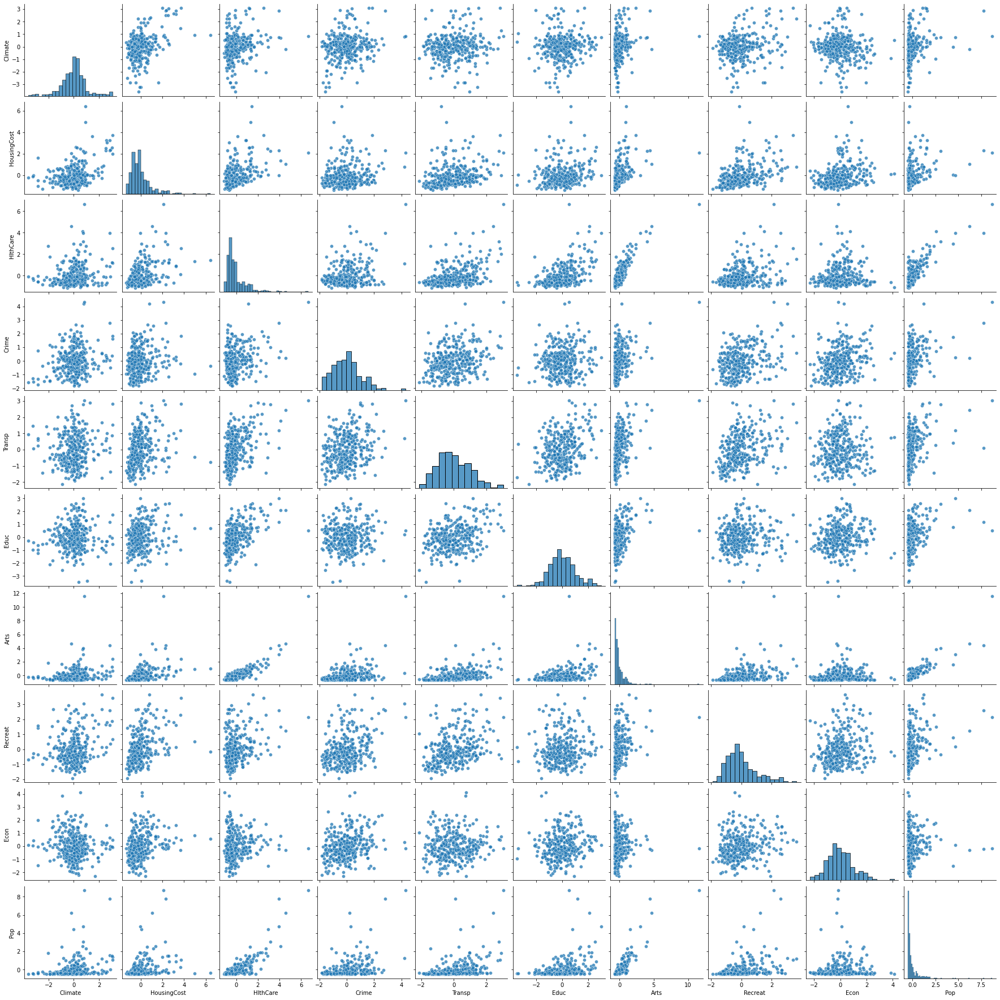

In [32]:
sns.pairplot(data_df, plot_kws={'alpha': 0.75}, vars=data_df.columns)
plt.show()

In [33]:
def draw_clust_results(data, labels):
    new_data = data.copy()
    new_data['cluster'] = labels
    sns.pairplot(new_data, hue='cluster', plot_kws={'alpha': 0.75}, vars=data.columns)
    plt.show()

## Задания 2. Иерархии

In [34]:
labels_all = dict()

### Ward + Euclidean

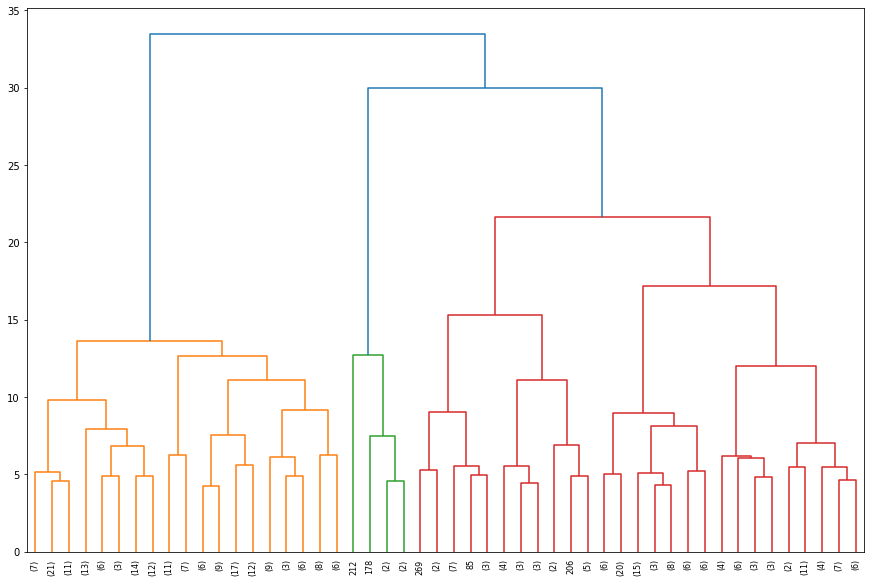

In [35]:
clustering = hierarchy.linkage(data_1, method='ward', metric='euclidean')
plt.figure(figsize=(15,10))
hierarchy.dendrogram(clustering
                     , p=50
                     , truncate_mode='lastp'
                     )
plt.show()

In [36]:
labels_ward_euc = hierarchy.fcluster(clustering, t=3, criterion='maxclust')
labels_all["labels_ward_euc"] = labels_ward_euc
labels_ward_euc

array([3, 1, 1, 3, 3, 1, 1, 1, 1, 1, 3, 3, 1, 1, 3, 1, 1, 1, 1, 3, 3, 1,
       1, 3, 1, 3, 3, 3, 1, 3, 1, 1, 1, 3, 3, 1, 1, 3, 1, 1, 3, 1, 2, 3,
       3, 1, 1, 3, 1, 3, 1, 3, 3, 1, 3, 1, 1, 1, 3, 1, 1, 3, 3, 1, 2, 1,
       3, 1, 3, 3, 3, 3, 1, 3, 3, 1, 3, 3, 1, 1, 3, 3, 1, 3, 3, 3, 1, 1,
       1, 3, 1, 1, 1, 1, 3, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 3, 3, 3, 3,
       1, 1, 3, 3, 3, 1, 3, 3, 1, 1, 1, 1, 1, 1, 1, 3, 1, 1, 1, 3, 3, 1,
       3, 1, 3, 1, 1, 3, 3, 1, 3, 3, 1, 1, 3, 1, 1, 3, 1, 3, 1, 3, 3, 3,
       1, 1, 1, 3, 3, 3, 1, 1, 3, 1, 3, 1, 1, 3, 1, 1, 1, 1, 3, 1, 3, 3,
       1, 1, 2, 3, 1, 1, 1, 1, 3, 1, 1, 1, 1, 3, 3, 3, 3, 3, 3, 3, 3, 1,
       1, 1, 1, 1, 1, 1, 1, 3, 3, 1, 3, 3, 3, 3, 2, 3, 1, 1, 3, 3, 3, 3,
       3, 1, 3, 1, 3, 1, 3, 1, 1, 1, 1, 1, 1, 2, 3, 1, 3, 1, 3, 3, 3, 1,
       3, 1, 1, 1, 3, 1, 1, 3, 1, 3, 3, 1, 1, 3, 1, 3, 1, 1, 1, 3, 1, 1,
       3, 1, 3, 3, 3, 3, 3, 3, 3, 1, 3, 1, 1, 3, 1, 1, 1, 3, 1, 1, 1, 1,
       3, 3, 1, 3, 1, 1, 1, 3, 3, 3, 3, 1, 1, 3, 1,

### Ward + Euclidean Версия 2 (4 кластера)

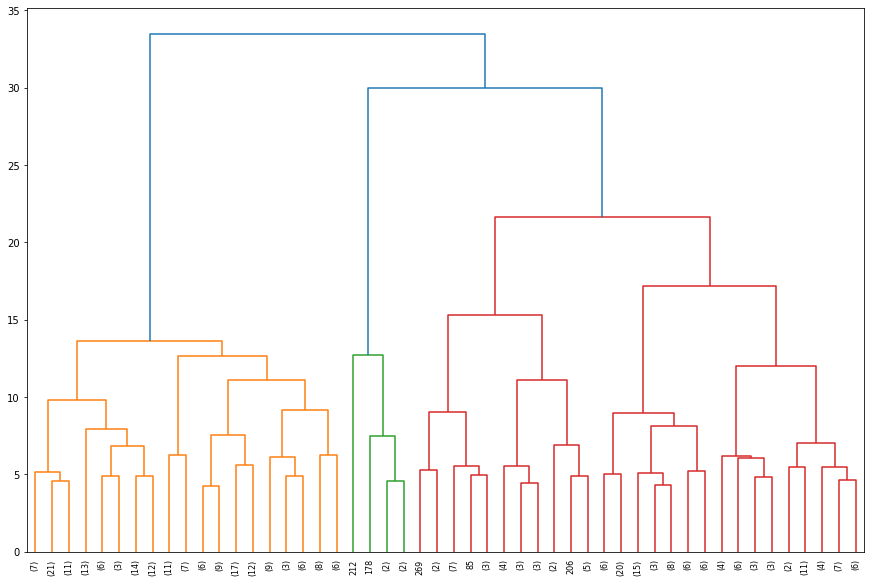

In [37]:
clustering = hierarchy.linkage(data_1, method='ward', metric='euclidean')
plt.figure(figsize=(15,10))
hierarchy.dendrogram(clustering
                     , p=50
                     , truncate_mode='lastp'
                     )
plt.show()

#### Сделаем 4 кластера


In [38]:
labels_ward_euc_2 = hierarchy.fcluster(clustering, t=4, criterion='maxclust')
labels_all["labels_ward_euc_2"] = labels_ward_euc_2
labels_ward_euc_2

array([4, 1, 1, 4, 4, 1, 1, 1, 1, 1, 3, 4, 1, 1, 4, 1, 1, 1, 1, 3, 4, 1,
       1, 4, 1, 3, 4, 4, 1, 4, 1, 1, 1, 3, 4, 1, 1, 4, 1, 1, 4, 1, 2, 4,
       4, 1, 1, 3, 1, 4, 1, 4, 4, 1, 4, 1, 1, 1, 4, 1, 1, 4, 4, 1, 2, 1,
       4, 1, 3, 4, 4, 4, 1, 4, 4, 1, 3, 3, 1, 1, 4, 4, 1, 3, 4, 3, 1, 1,
       1, 4, 1, 1, 1, 1, 4, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 4, 4, 4, 4,
       1, 1, 4, 4, 4, 1, 4, 4, 1, 1, 1, 1, 1, 1, 1, 4, 1, 1, 1, 4, 4, 1,
       3, 1, 3, 1, 1, 4, 4, 1, 4, 4, 1, 1, 4, 1, 1, 4, 1, 4, 1, 4, 4, 4,
       1, 1, 1, 4, 4, 4, 1, 1, 4, 1, 4, 1, 1, 4, 1, 1, 1, 1, 4, 1, 4, 4,
       1, 1, 2, 4, 1, 1, 1, 1, 4, 1, 1, 1, 1, 4, 4, 3, 3, 4, 4, 3, 3, 1,
       1, 1, 1, 1, 1, 1, 1, 4, 3, 1, 4, 4, 4, 4, 2, 3, 1, 1, 3, 3, 4, 4,
       4, 1, 4, 1, 4, 1, 3, 1, 1, 1, 1, 1, 1, 2, 4, 1, 3, 1, 4, 4, 4, 1,
       4, 1, 1, 1, 4, 1, 1, 4, 1, 4, 4, 1, 1, 4, 1, 4, 1, 1, 1, 3, 1, 1,
       3, 1, 4, 4, 3, 3, 3, 3, 3, 1, 4, 1, 1, 3, 1, 1, 1, 4, 1, 1, 1, 1,
       4, 4, 1, 3, 1, 1, 1, 4, 4, 4, 4, 1, 1, 4, 1,

### Complete + Euclidean

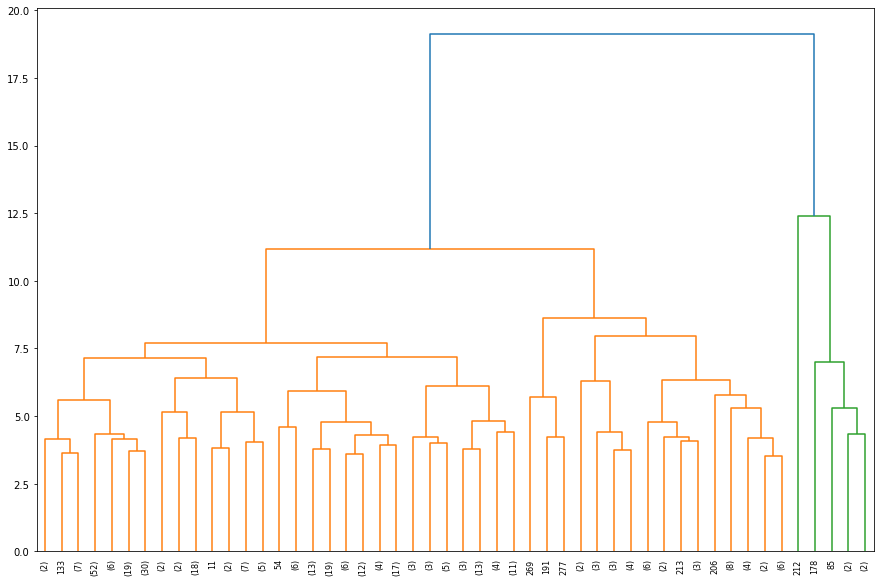

In [39]:
clustering = hierarchy.linkage(data_1, method='complete', metric='euclidean')
plt.figure(figsize=(15,10))
hierarchy.dendrogram(clustering
                     , p=50
                     , truncate_mode='lastp'
                     )
plt.show()

In [40]:
labels_comp_euc = hierarchy.fcluster(clustering, t=4, criterion='maxclust')
labels_all["labels_comp_euc"] = labels_comp_euc
labels_comp_euc

array([1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 1, 1, 1, 2, 1, 1, 1, 1, 2, 1, 1,
       1, 1, 1, 2, 1, 1, 1, 1, 1, 1, 1, 2, 1, 1, 1, 1, 1, 1, 1, 1, 3, 1,
       1, 1, 1, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 1, 3, 1,
       1, 1, 2, 1, 1, 1, 1, 1, 1, 1, 2, 2, 1, 1, 1, 1, 1, 2, 1, 3, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 1,
       2, 1, 2, 1, 1, 1, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 3, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 2, 1, 1, 2, 2, 1,
       1, 2, 1, 1, 1, 1, 1, 1, 2, 1, 1, 2, 1, 2, 4, 2, 1, 2, 2, 2, 1, 1,
       1, 1, 1, 2, 1, 1, 2, 1, 1, 1, 1, 1, 1, 3, 1, 1, 2, 1, 1, 2, 1, 1,
       2, 1, 1, 1, 2, 1, 1, 1, 1, 1, 1, 1, 1, 2, 1, 1, 1, 1, 1, 2, 1, 2,
       2, 1, 1, 1, 2, 2, 2, 2, 2, 2, 1, 1, 1, 2, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,

****Вывод**: 4 - й кластер состоит только из одного элемента (212 элемент- левая зеленая линия)

### Complete + CityBlock

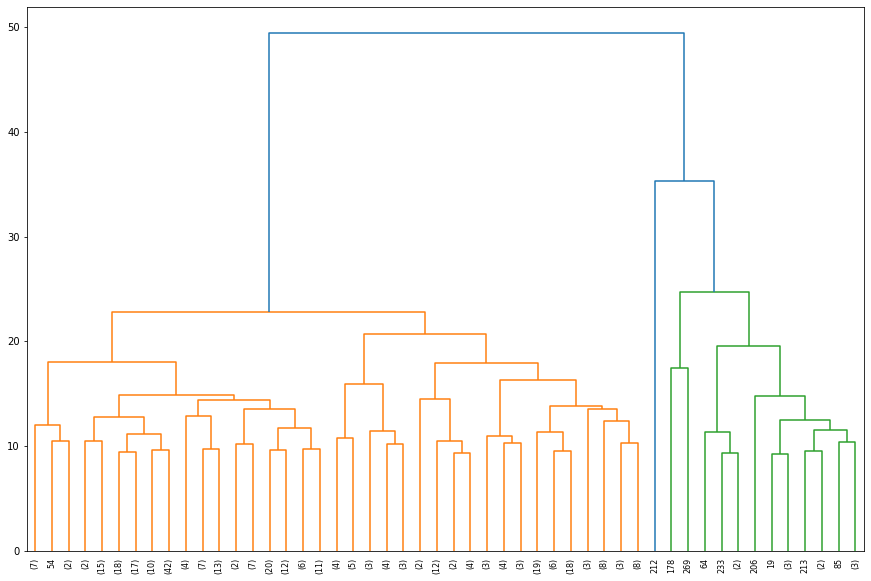

In [41]:
clustering = hierarchy.linkage(data_1, method='complete', metric='cityblock')
plt.figure(figsize=(15,10))
hierarchy.dendrogram(clustering
                     , p=50, truncate_mode='lastp'
                     )
plt.show()

In [42]:
labels_comp_cb = hierarchy.fcluster(clustering, t=3, criterion='maxclust')
labels_all["labels_comp_cb"] = labels_comp_cb
labels_comp_cb

array([1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 1, 1,
       1, 1, 1, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 1,
       1, 1, 2, 1, 1, 1, 1, 1, 1, 1, 2, 1, 1, 1, 1, 1, 1, 1, 1, 2, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 2, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 2, 1, 1, 1, 1, 1, 3, 2, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 1, 1, 2, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 1, 1,
       1, 1, 1, 1, 1, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,

****Вывод**: один из кластеров является только одним элементом, как и в случае с евклидовой метрикой,
но теперь оранжевая часть графика имеет менее очевидное расщепление

### Complete + Cosine

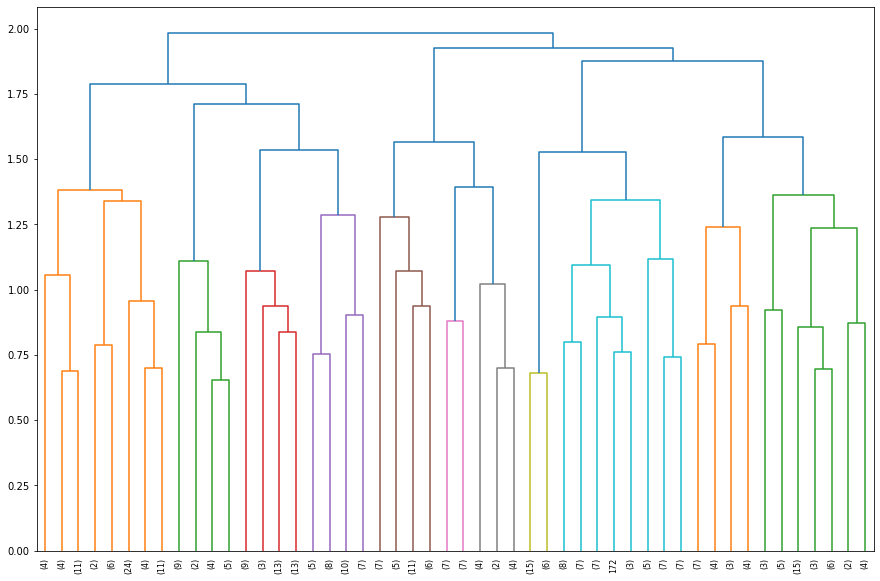

In [43]:
clustering = hierarchy.linkage(data_1, method='complete', metric='cosine')
plt.figure(figsize=(15,10))
hierarchy.dendrogram(clustering
                     , p=50
                     , truncate_mode='lastp'
                     )
plt.show()

In [44]:
labels_comp_cos = hierarchy.fcluster(clustering, t=10, criterion='maxclust')
labels_all["labels_comp_cos"] = labels_comp_cos
labels_comp_cos

array([ 2, 10,  3,  8,  8,  3,  1,  1,  1,  9,  5,  6,  1,  3,  7,  1, 10,
        1,  4,  8,  6,  3,  6,  2,  4,  8, 10,  4,  9,  4,  1,  5,  4,  7,
       10,  3,  1,  8, 10,  3, 10,  9,  7,  6,  2,  3,  1,  5,  2,  2,  4,
        2,  7,  3, 10,  1,  6, 10,  8,  8,  1,  8,  8,  1,  7,  1,  7,  3,
        7,  6,  9,  8,  1,  7,  4,  1,  8,  5,  3, 10,  8,  6,  1,  8,  6,
        7,  3,  1, 10,  9, 10,  4,  1,  3,  2,  9,  1,  1,  9, 10,  1,  1,
        3,  9,  1,  1,  5,  6, 10,  2,  3,  3, 10,  6,  6,  1,  8,  5,  9,
        3, 10,  1, 10,  3, 10,  8,  1,  1,  1,  8,  8,  3,  5,  3,  8,  1,
        3,  8,  3,  9,  8, 10,  3,  1,  8,  1,  1, 10,  3, 10,  3,  8,  8,
       10,  2,  1,  1, 10, 10,  6,  4,  5,  4,  1, 10,  3,  4,  6,  4,  6,
        4,  1,  8,  1, 10,  9,  2,  1,  7,  8,  6,  4,  1,  3, 10,  2,  4,
        3,  1,  5,  8,  5,  7,  2,  6,  7,  7,  4,  4,  7,  4,  1,  1,  4,
        2,  8,  7,  4,  8,  8,  2,  8,  7,  7,  9,  7,  5,  5,  4,  2,  6,
        1, 10,  5,  6,  3

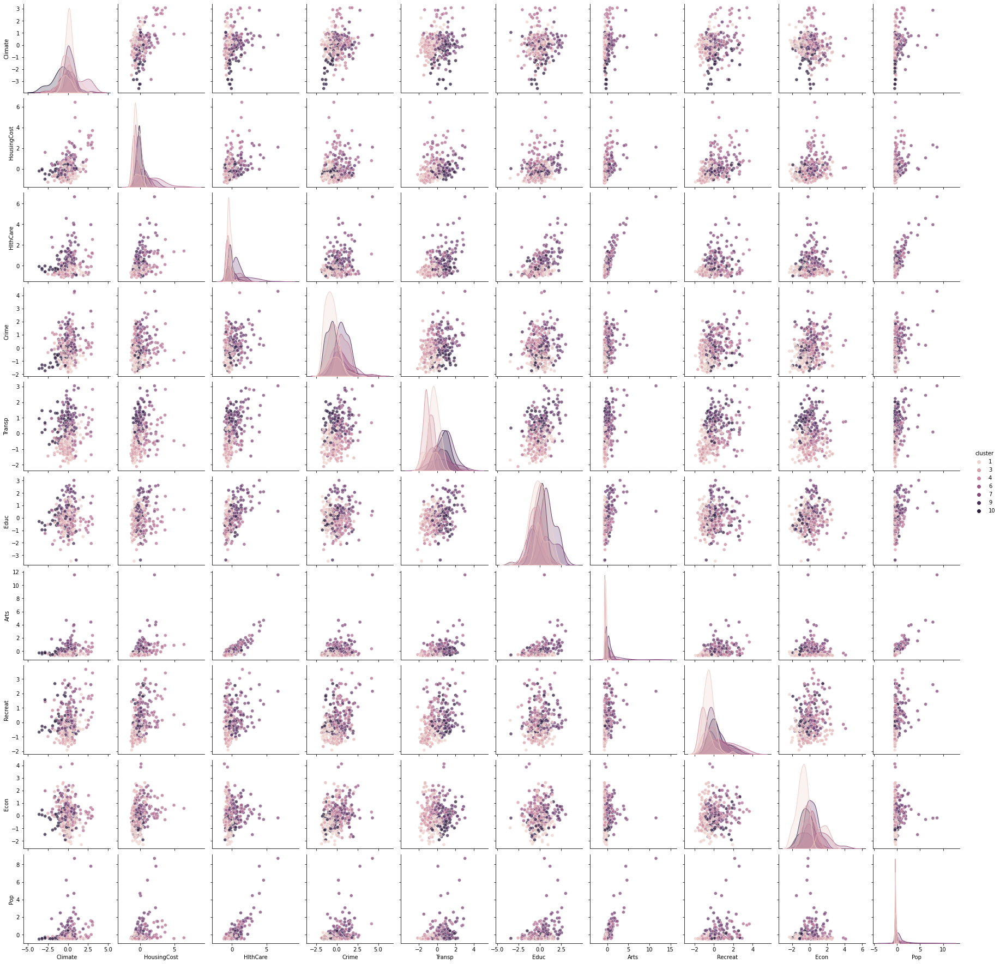

In [45]:
draw_clust_results(data_df, labels_comp_cos)

**Вывод**: по участкам на главной диагонали видно, как все кластеры сливаются друг с другом, получается плохая кластеризация

### Median + Euclidean

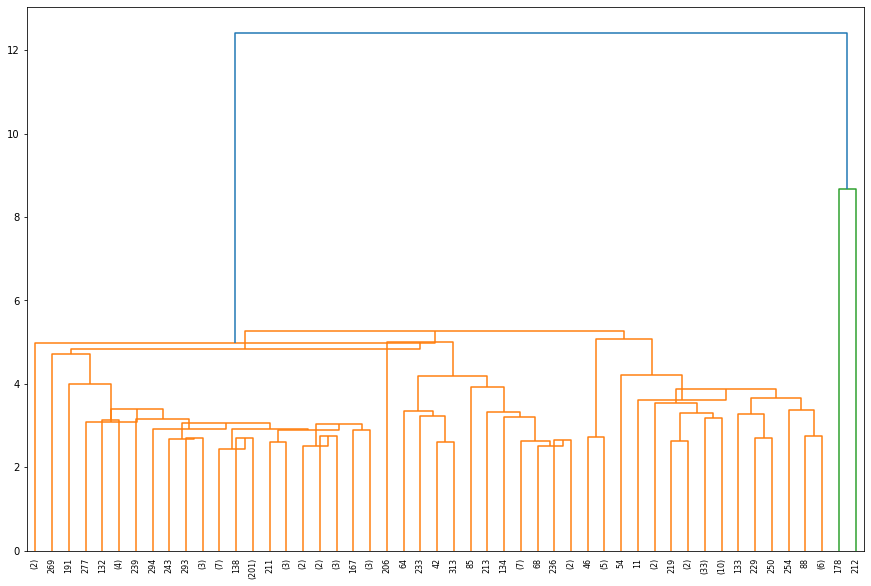

In [46]:
clustering = hierarchy.linkage(data_1, method='median', metric='euclidean')
plt.figure(figsize=(15,10))
hierarchy.dendrogram(clustering
                     , p=50, truncate_mode='lastp'
                     )
plt.show()

In [47]:
labels_med_euc = hierarchy.fcluster(clustering, t=2, criterion='maxclust')
labels_all["labels_med_euc"] = labels_med_euc
labels_med_euc

array([1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,

### Weighted + CityBlock

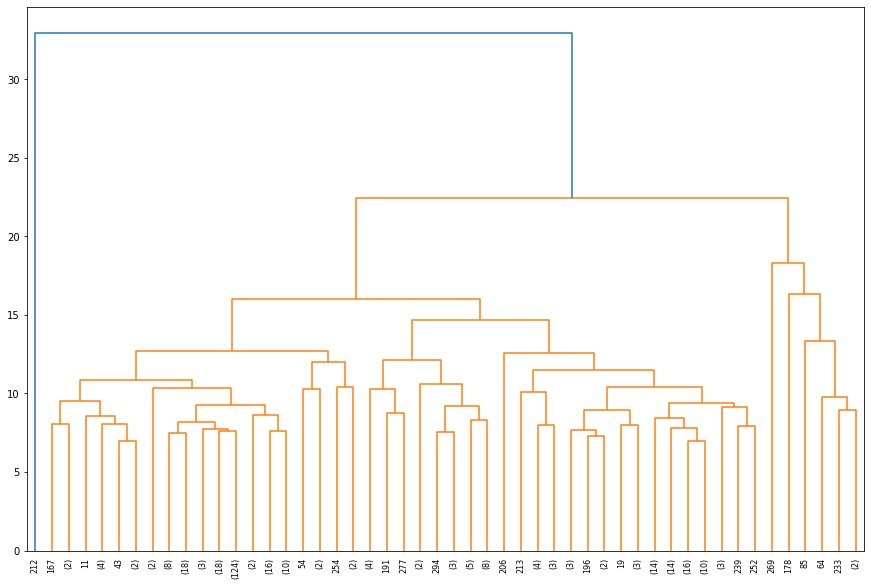

In [48]:
clustering = hierarchy.linkage(data_1, method='weighted', metric='cityblock')
plt.figure(figsize=(15,10))
hierarchy.dendrogram(clustering
                     , p=50, truncate_mode='lastp'
                     )
plt.show()

In [49]:
labels_w_cb = hierarchy.fcluster(clustering, t=3, criterion='maxclust')
labels_all["labels_w_cb"] = labels_w_cb
labels_w_cb

array([1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 3, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,

### Weighted + Euclidean

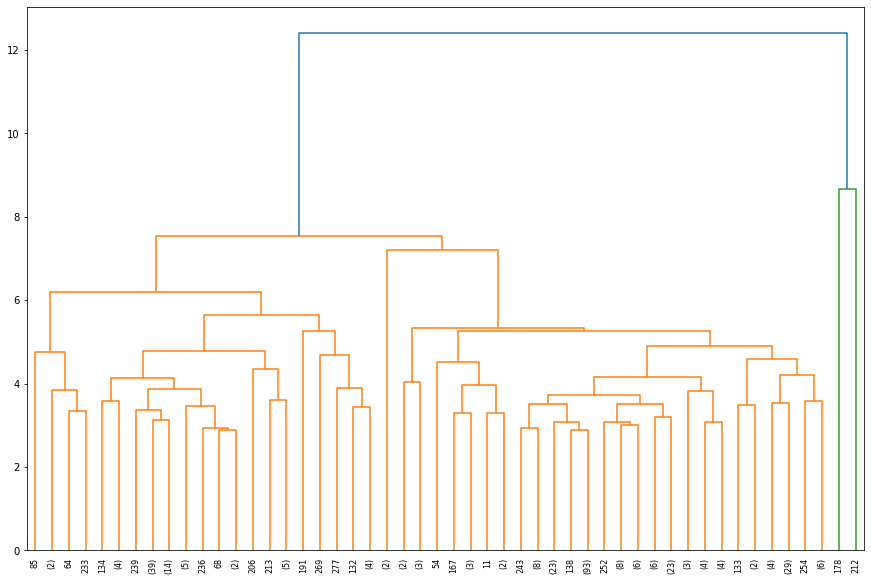

In [50]:
clustering = hierarchy.linkage(data_1, method='weighted', metric='euclidean')
plt.figure(figsize=(15,10))
hierarchy.dendrogram(clustering
                     , p=50, truncate_mode='lastp'
                     )
plt.show()

In [51]:
labels_w_euc = hierarchy.fcluster(clustering, t=2, criterion='maxclust')
labels_all["labels_w_euc"] = labels_w_euc
labels_w_euc

array([1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,

### Общие результаты

In [52]:
def compare_clustering(label_results: {}, data, func=silhouette_score, decrease_order=False):
  table = list()
  for key, value in label_results.items():
    score = func(data, value)
    table.append((key, score, len(set(value)), [list(value).count(label) for label in set(value)]))

  table = sorted(table, key=lambda row: row[1], reverse=decrease_order)
  print(tb(table, headers=["Metrics", "Score", "Labels", "Distribution"], tablefmt="git"))
 

##### Метрика

In [53]:
print("silhouette_score")
compare_clustering(labels_all, data_1)

silhouette_score
Metrics                Score    Labels  Distribution
-----------------  ---------  --------  ----------------------------------------
labels_comp_cos    0.0572602        10  [66, 20, 38, 30, 29, 24, 21, 45, 18, 38]
labels_ward_euc_2  0.148061          4  [181, 6, 32, 110]
labels_ward_euc    0.174079          3  [181, 6, 142]
labels_comp_euc    0.305314          4  [274, 48, 6, 1]
labels_comp_cb     0.444239          3  [310, 18, 1]
labels_w_cb        0.556204          3  [321, 7, 1]
labels_med_euc     0.721022          2  [327, 2]
labels_w_euc       0.721022          2  [327, 2]


In [54]:
print("davies_bouldin_score")
compare_clustering(labels_all, data_1, davies_bouldin_score, decrease_order=True)

davies_bouldin_score
Metrics               Score    Labels  Distribution
-----------------  --------  --------  ----------------------------------------
labels_comp_cos    1.885           10  [66, 20, 38, 30, 29, 24, 21, 45, 18, 38]
labels_ward_euc_2  1.8469           4  [181, 6, 32, 110]
labels_ward_euc    1.63867          3  [181, 6, 142]
labels_comp_euc    1.15806          4  [274, 48, 6, 1]
labels_comp_cb     0.799998         3  [310, 18, 1]
labels_w_cb        0.637066         3  [321, 7, 1]
labels_med_euc     0.508665         2  [327, 2]
labels_w_euc       0.508665         2  [327, 2]


##### Euclidean and Ward (3 labels)

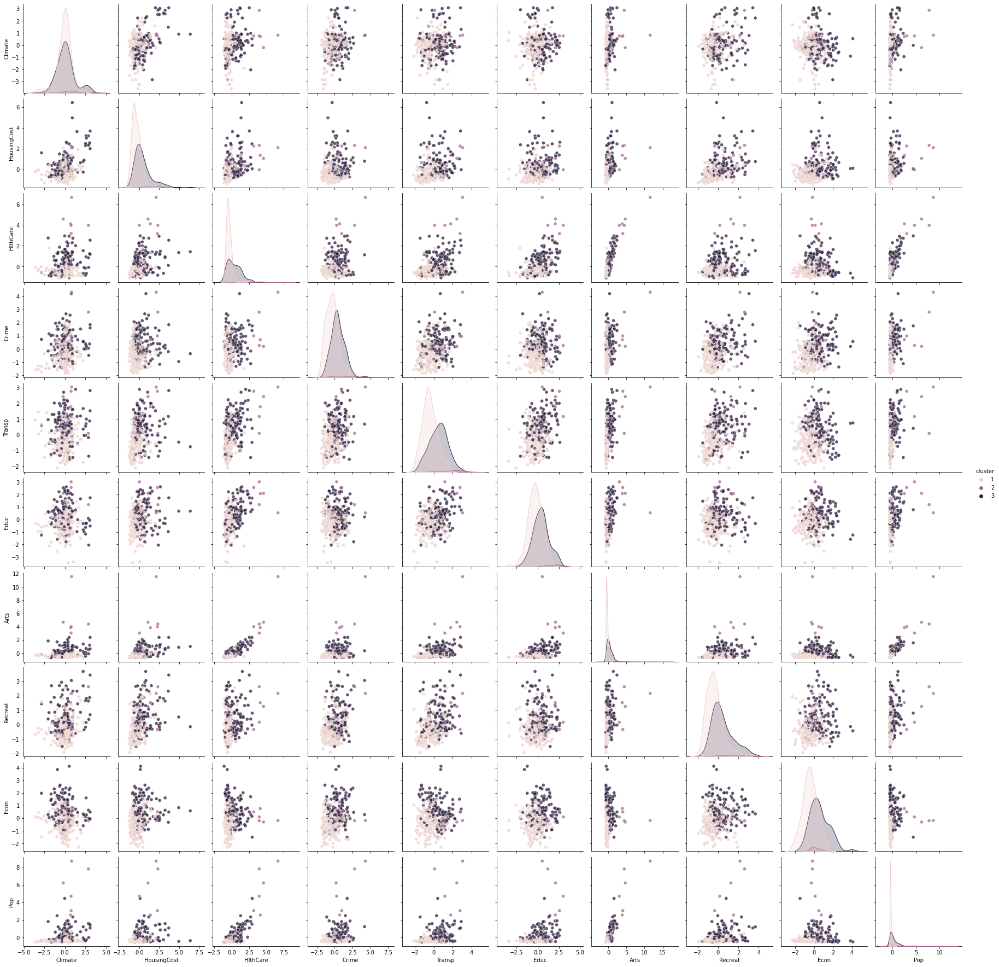

In [55]:
draw_clust_results(data_df, labels_ward_euc)

##### CityBlocks and Complete

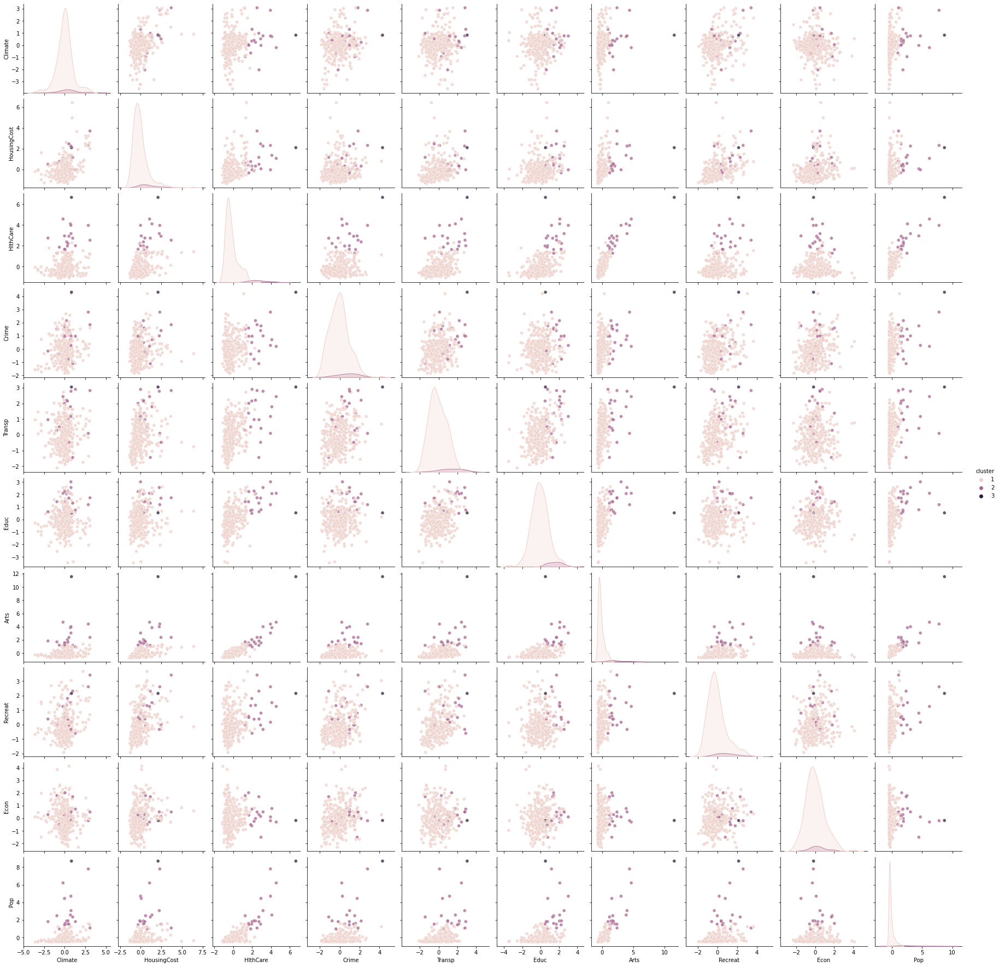

In [56]:
draw_clust_results(data_df, labels_comp_cb)

### Заключение:
##### Многие из вариантов кластеризации имеют крайне неравномерное распределение (1 гиганский кластер) или плохую метрическую оценку.
#### Самые кайфовые:
* Ward + Euclidean - хорошее распределение между кластерами, имеет средний балл, многие особенности кластеров видны визуально
* Complete + CityBlock - визуально заметно расщепление: кластер с высокой плотностью объектов, низкой плотностью и один спец объект, не похожий на другие; имеет высокий балл.

## Задание 3.  DBSCAN

In [57]:
dbsсan_labels_all = {}

In [58]:
def dbscan_clustering(eps=1, min_samples=5, metric='euclidean'):
  dbscan_clustering = My_DBSCAN(eps=eps, min_samples=min_samples, metric=metric)
  dbscan_clustering.fit(data_1)

  print("Clusters numbers:", np.max(dbscan_clustering.labels_) + 1)
  outliers_num = list(dbscan_clustering.labels_).count(-1)
  print("Outliers numbers:", outliers_num
        , '|', str(outliers_num/len(dbscan_clustering.labels_)*100)[:4]+'%')
  return dbscan_clustering.labels_

### Euclidean

In [59]:
dbscan_labels = dbscan_clustering(eps=1, min_samples=5, metric='euclidean')
dbscan_labels

Clusters numbers: 1
Outliers numbers: 318 | 96.6%


array([-1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1,
       -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1,
       -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1,
       -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1,
       -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1,  0, -1, -1,
       -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1,  0, -1, -1, -1, -1,
       -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1,
       -1, -1,  0, -1, -1, -1, -1, -1, -1,  0, -1, -1, -1, -1, -1, -1, -1,
       -1, -1, -1, -1, -1, -1, -1,  0, -1, -1, -1, -1, -1, -1, -1, -1, -1,
       -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1,  0, -1,
       -1,  0, -1,  0, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1,
       -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1,
       -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1,
       -1, -1, -1, -1, -1

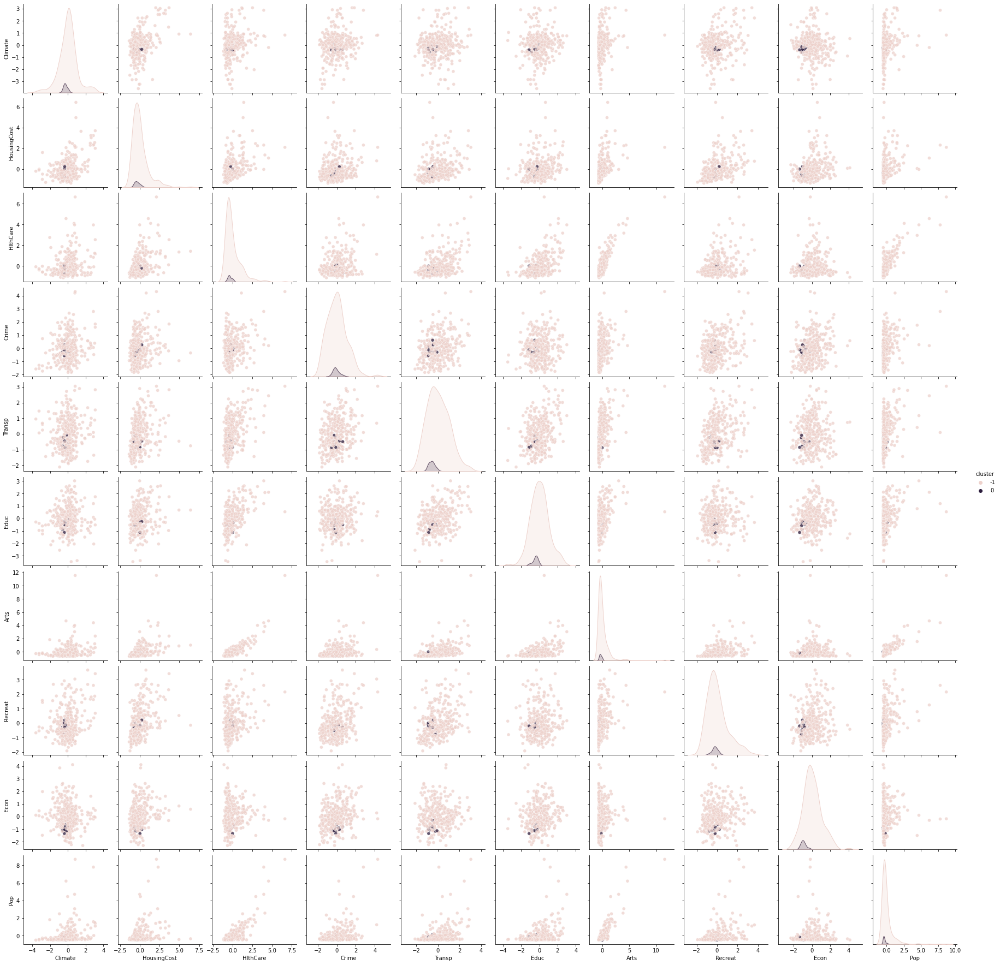

In [60]:
draw_clust_results(data_df, dbscan_labels)

###### 1 big кластер и many выбросов, попробуем фиксить уменьшением min_samples и увеличением epsilon

In [61]:
dbscan_labels = dbscan_clustering(eps=3, min_samples=2, metric='euclidean')
dbscan_labels

Clusters numbers: 2
Outliers numbers: 8 | 2.43%


array([ 0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,
        0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,
        0,  0,  0,  0,  0,  0,  0,  0,  1,  0,  0,  0,  0,  0,  0,  0,  0,
        0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0, -1,  0,  0,  0,
        0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,
       -1,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,
        0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,
        0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,
        0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,
        0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,
        0,  0,  0,  0,  0,  0,  0,  0, -1,  0,  0,  0,  0,  0,  0,  0,  0,
        0,  0,  0,  0, -1,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,
        0,  0, -1,  0,  0,  0,  0,  0, -1,  0,  0,  0,  0,  0,  0,  0,  0,
        0,  0,  0,  0,  0

#### Энивей хоть и 2 кластера 1 из них очень большой

### Cosine

In [62]:
dbscan_labels = dbscan_clustering(eps=2, min_samples=5, metric='cosine')
dbscan_labels

Clusters numbers: 1
Outliers numbers: 0 | 0.0%


array([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,

#### даже с разными аргументами получается 1 кластер без выбросов

### CityBlock

In [63]:
dbscan_labels = dbscan_clustering(eps=1, min_samples=4, metric='cityblock')
dbscan_labels

Clusters numbers: 0
Outliers numbers: 329 | 100.%


array([-1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1,
       -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1,
       -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1,
       -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1,
       -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1,
       -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1,
       -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1,
       -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1,
       -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1,
       -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1,
       -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1,
       -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1,
       -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1,
       -1, -1, -1, -1, -1

#### ROFL толькО одни выбросы
#### можно попробывать  увеличить epsilon, чтобы поискать основые узлы

In [64]:
dbscan_labels = dbscan_clustering(eps=5, min_samples=4, metric='cityblock')
dbscan_labels

Clusters numbers: 1
Outliers numbers: 53 | 16.1%


array([ 0,  0,  0,  0,  0,  0,  0,  0,  0,  0, -1, -1,  0,  0,  0,  0,  0,
        0,  0, -1, -1,  0,  0,  0,  0, -1,  0,  0,  0,  0,  0,  0,  0, -1,
        0,  0,  0,  0,  0,  0,  0,  0, -1, -1,  0,  0,  0, -1,  0,  0,  0,
        0,  0,  0, -1,  0,  0,  0,  0,  0,  0,  0,  0,  0, -1,  0,  0,  0,
       -1,  0,  0,  0,  0,  0,  0,  0, -1, -1,  0,  0,  0,  0,  0, -1,  0,
       -1,  0,  0, -1,  0,  0,  0,  0,  0,  0,  0, -1,  0,  0,  0,  0,  0,
        0,  0,  0,  0,  0,  0,  0, -1,  0,  0,  0,  0,  0,  0,  0,  0,  0,
        0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0, -1,  0, -1, -1, -1,  0,
        0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,
        0,  0,  0,  0,  0,  0, -1,  0,  0,  0,  0,  0,  0,  0, -1,  0,  0,
        0,  0,  0,  0,  0,  0,  0,  0, -1,  0,  0,  0,  0,  0,  0,  0,  0,
        0,  0,  0,  0, -1,  0,  0, -1,  0, -1,  0,  0,  0,  0,  0,  0,  0,
        0,  0, -1,  0,  0,  0,  0, -1, -1, -1,  0,  0, -1, -1,  0,  0,  0,
        0,  0,  0,  0,  0

#### OMG Появился целый один кластер и при этом остались выбросы
#### можем понизить min_samples до 3 и посмотрим

In [65]:
dbscan_labels = dbscan_clustering(eps=5, min_samples=3, metric='cityblock')
dbscan_labels

Clusters numbers: 3
Outliers numbers: 45 | 13.6%


array([ 0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  2, -1,  0,  0,  0,  0,  0,
        0,  0, -1, -1,  0,  0,  0,  0, -1,  0,  0,  0,  0,  0,  0,  0,  0,
        0,  0,  0,  0,  0,  0,  0,  0, -1, -1,  0,  0,  0, -1,  0,  0,  0,
        0,  0,  0, -1,  0,  0,  0,  0,  0,  0,  0,  0,  0, -1,  0,  0,  0,
       -1,  0,  0,  0,  0,  0,  0,  0,  1, -1,  0,  0,  0,  0,  0,  1,  0,
       -1,  0,  0, -1,  0,  0,  0,  0,  0,  0,  0, -1,  0,  0,  0,  0,  0,
        0,  0,  0,  0,  0,  0,  0, -1,  0,  0,  0,  0,  0,  0,  0,  0,  0,
        0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0, -1,  0, -1, -1,  1,  0,
        0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,
        0,  0,  0,  0,  0,  0, -1,  0,  0,  0,  0,  0,  0,  0, -1,  0,  0,
        0,  0,  0,  0,  0,  0,  0,  0, -1,  0,  0,  0,  0,  0,  0,  0,  0,
        0,  0,  0,  0, -1,  0,  0, -1,  0, -1,  0,  0,  0,  0,  0,  0,  0,
        0,  0, -1,  0,  0,  0,  0, -1, -1, -1,  0,  0, -1,  2,  0,  0,  0,
        0,  0,  0,  0,  0

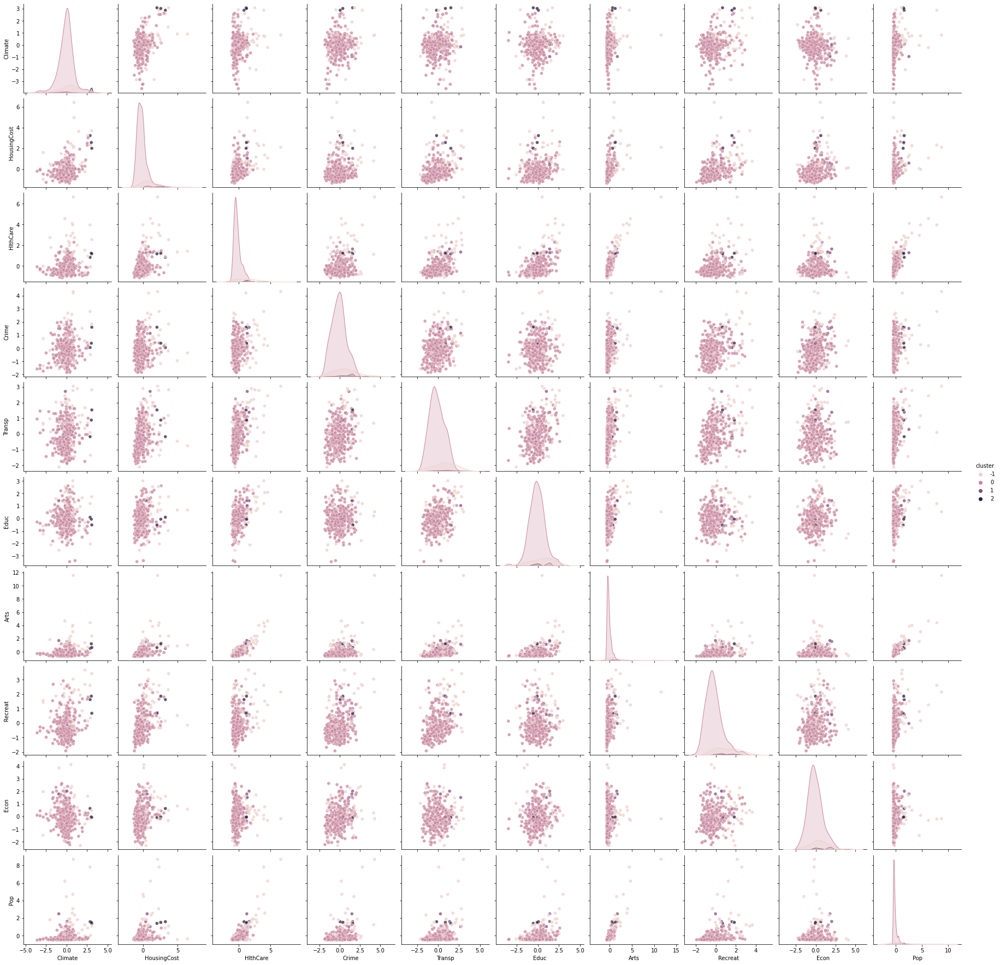

In [66]:
draw_clust_results(data_df, dbscan_labels)

**На выходе мы получили:**
* кластеры имеют очень неравномерное распределение
* кластеры пересекаются
* отсутствуют визуальные зависимости

### Заключение:
##### DBSCAN в большинстве вариантов дает один огромный кластер либо еще пару микрокластеров(not good).
##### Плюс к этому DBSCAN получает много выбросов иногда больше половины.
#### Для этих данных DBSCAN является неудачным выбором
* Многие объекты находятся достаточно близко друг к другу, и алгоритм объединяет их в одну большую группу.
* В то же время некоторые выделяющиеся объекты попадают в группу выбросов.

#### Можно еще понадрываться и поизменять данные в цикле, но энивей это не даст намного лучшего результата

## Задание 4. K-means

In [145]:
def elbow(data, clusters_min, clusters_max, seed=10, max_iter=300, n_init=10):
    distortions = []
    plt.figure(figsize=(16, 8))
    for i in range(clusters_min, clusters_max):
        clustering = KMeans(n_clusters=i, n_init=n_init, max_iter=max_iter, random_state=seed)
        clustering.fit(data)
        distortions.append(clustering.inertia_)
    plt.plot(range(clusters_min, clusters_max), distortions, 'x-r')
    plt.show()


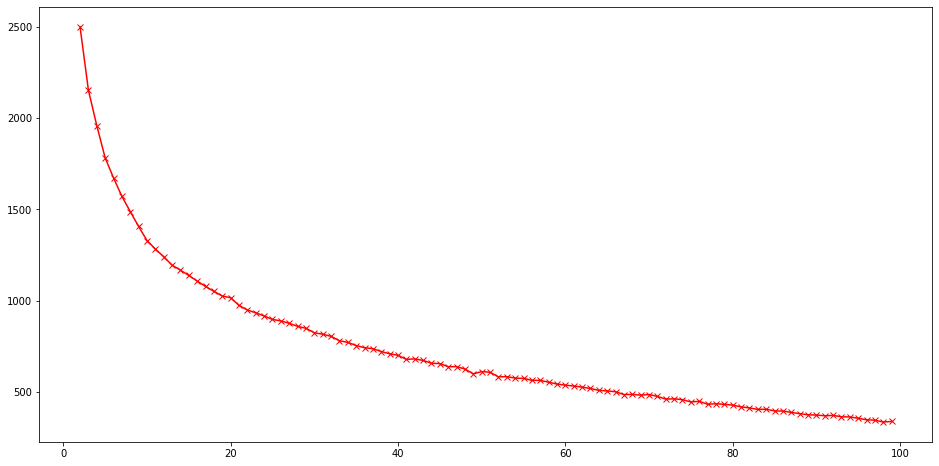

In [146]:
elbow(data_df, 2, 100)

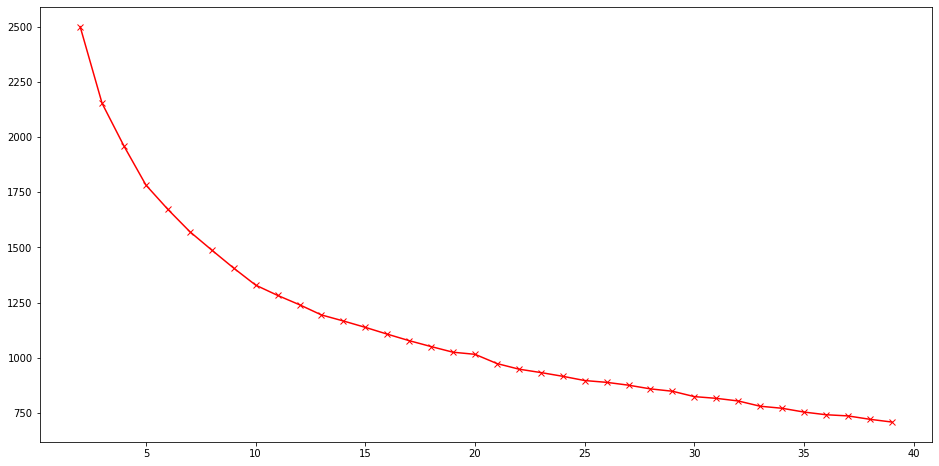

In [147]:
elbow(data_df, 2, 40)

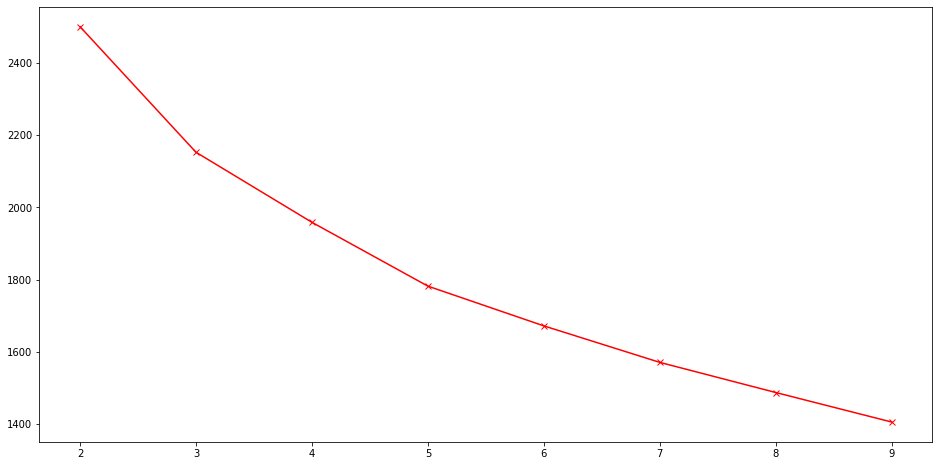

In [148]:
elbow(data_df, 2, 10)

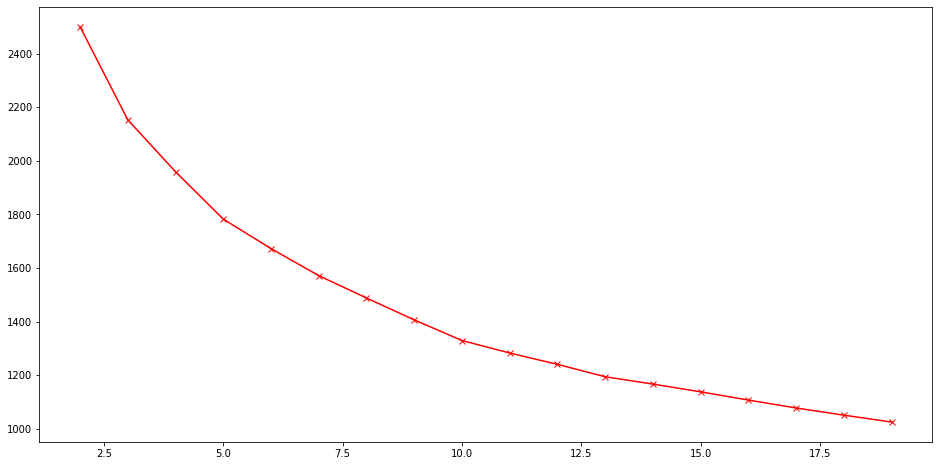

In [149]:
elbow(data_df, 2, 20)

In [150]:
kmeans_labels_all = {}

In [151]:
kmeans_clustering = KMeans(n_clusters=4, random_state=13)
kmeans_clustering.fit(data_1)
kmeans_labels_all["kmean_labels_4"] = kmeans_labels_4 = kmeans_clustering.labels_
kmeans_labels_4

array([0, 2, 2, 0, 3, 2, 2, 2, 2, 0, 3, 0, 2, 2, 3, 2, 2, 2, 2, 3, 0, 2,
       2, 0, 0, 3, 2, 0, 2, 0, 2, 2, 2, 3, 0, 2, 2, 0, 2, 2, 0, 2, 1, 0,
       0, 2, 2, 3, 2, 0, 2, 0, 3, 2, 0, 2, 0, 2, 0, 0, 2, 0, 0, 2, 1, 2,
       3, 2, 3, 0, 2, 0, 2, 0, 0, 2, 3, 3, 2, 2, 0, 0, 2, 3, 0, 1, 2, 2,
       2, 0, 2, 2, 2, 2, 0, 2, 3, 2, 2, 2, 2, 2, 2, 2, 2, 0, 0, 0, 0, 0,
       2, 2, 2, 0, 0, 2, 0, 0, 2, 2, 2, 2, 2, 2, 2, 0, 0, 2, 2, 0, 3, 2,
       3, 2, 3, 2, 2, 0, 2, 2, 0, 0, 2, 2, 0, 2, 2, 2, 2, 0, 2, 0, 0, 0,
       2, 2, 2, 0, 2, 0, 2, 0, 0, 2, 0, 2, 0, 0, 2, 0, 2, 2, 0, 2, 0, 0,
       2, 2, 1, 0, 0, 0, 2, 2, 0, 0, 2, 2, 2, 0, 0, 3, 3, 0, 0, 3, 3, 0,
       2, 3, 2, 2, 2, 2, 0, 0, 3, 2, 0, 3, 0, 3, 1, 3, 2, 3, 3, 3, 0, 0,
       0, 2, 0, 0, 0, 2, 3, 0, 2, 2, 2, 0, 2, 1, 0, 2, 3, 2, 0, 3, 0, 0,
       3, 2, 2, 2, 3, 2, 2, 0, 2, 3, 3, 2, 2, 3, 2, 0, 2, 2, 2, 3, 2, 0,
       3, 3, 0, 0, 3, 3, 3, 3, 3, 3, 0, 0, 2, 3, 2, 2, 2, 0, 2, 2, 0, 2,
       0, 0, 2, 3, 2, 2, 0, 0, 3, 0, 0, 2, 2, 0, 0,

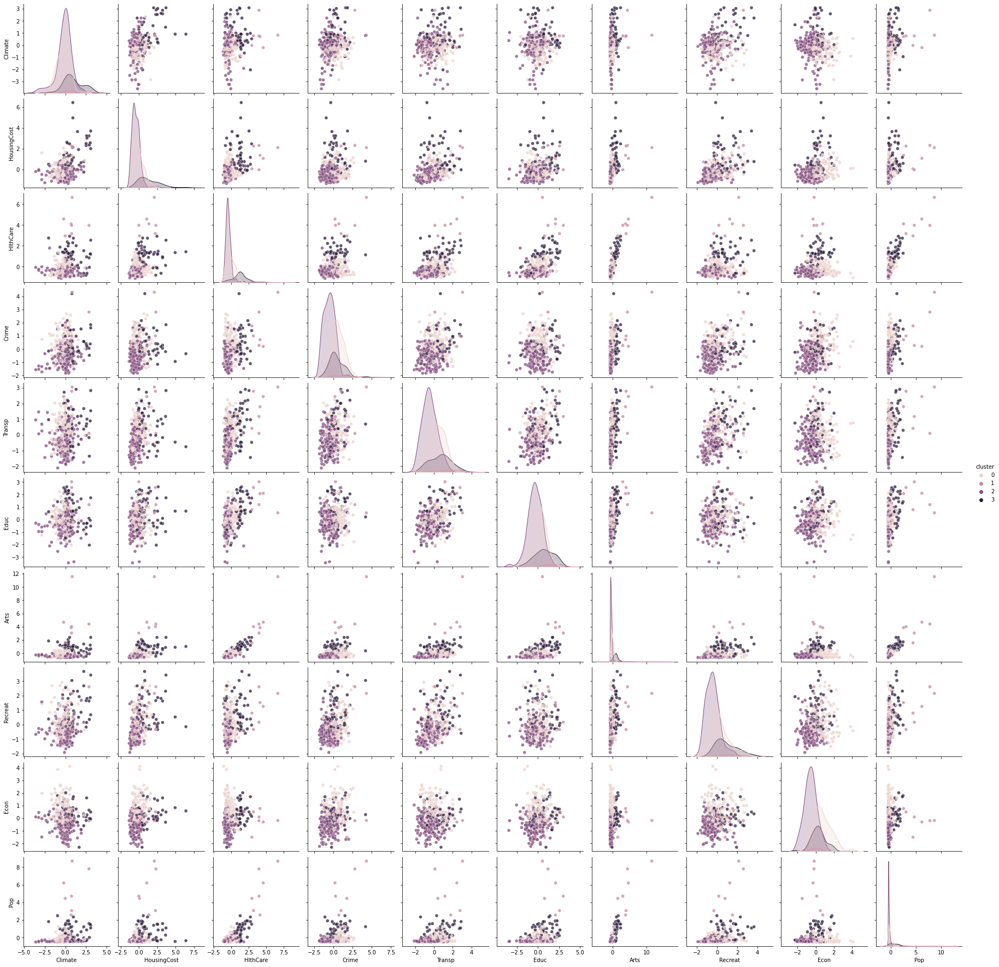

In [152]:
draw_clust_results(data_df, kmeans_labels_4)

In [153]:
kmeans_clustering = KMeans(n_clusters=5, random_state=12)
kmeans_clustering.fit(data_1)
kmeans_labels_all["kmeans_labels_5"] = kmeans_labels_5 = kmeans_clustering.labels_
kmeans_labels_5

array([4, 1, 1, 2, 2, 1, 1, 1, 1, 4, 3, 4, 1, 1, 2, 1, 1, 1, 1, 2, 4, 1,
       1, 4, 4, 2, 1, 4, 1, 4, 1, 1, 1, 3, 4, 1, 1, 2, 1, 1, 1, 1, 0, 4,
       4, 1, 1, 3, 1, 4, 1, 4, 2, 1, 2, 1, 4, 1, 2, 2, 1, 2, 2, 1, 0, 1,
       2, 1, 2, 4, 1, 2, 1, 2, 4, 1, 2, 3, 1, 1, 2, 4, 1, 2, 1, 0, 1, 1,
       1, 4, 1, 1, 1, 1, 4, 1, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 4, 4, 4, 4,
       1, 1, 1, 4, 4, 1, 4, 4, 1, 1, 1, 1, 1, 1, 1, 2, 2, 1, 1, 2, 2, 1,
       3, 1, 2, 1, 1, 2, 1, 1, 2, 2, 1, 1, 2, 1, 1, 1, 1, 2, 1, 2, 2, 1,
       1, 1, 1, 1, 1, 4, 4, 3, 4, 1, 2, 1, 4, 4, 1, 4, 4, 1, 2, 1, 1, 1,
       4, 1, 0, 2, 4, 4, 1, 1, 2, 4, 1, 1, 1, 4, 2, 2, 2, 4, 4, 2, 2, 1,
       1, 3, 1, 1, 1, 1, 4, 2, 3, 1, 4, 2, 4, 2, 0, 3, 1, 2, 3, 3, 4, 4,
       4, 1, 2, 1, 4, 1, 3, 4, 1, 1, 1, 4, 1, 0, 2, 1, 2, 1, 4, 2, 4, 4,
       2, 1, 1, 1, 2, 1, 1, 4, 1, 2, 2, 1, 1, 2, 1, 2, 1, 1, 1, 2, 2, 3,
       3, 2, 4, 4, 3, 3, 3, 3, 3, 3, 4, 4, 1, 3, 1, 1, 1, 4, 1, 1, 1, 1,
       2, 2, 1, 3, 1, 1, 4, 2, 2, 4, 2, 1, 1, 2, 1,

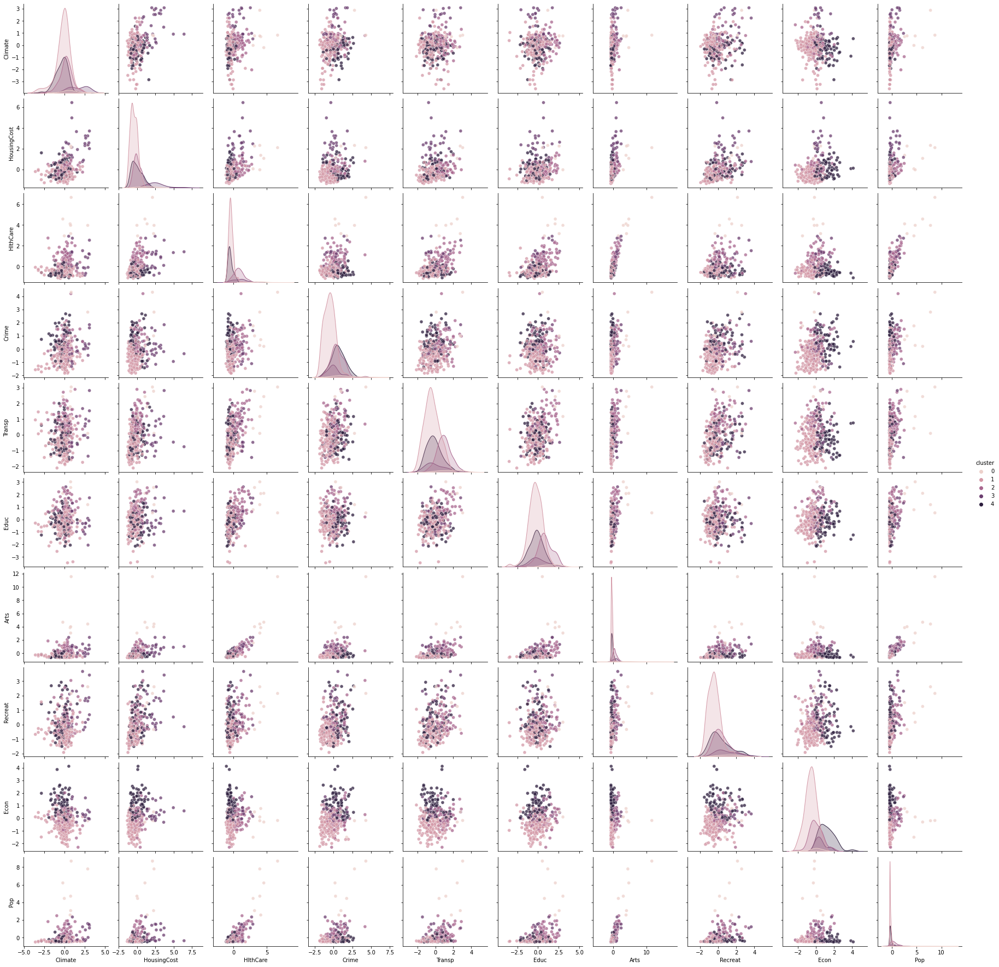

In [154]:
draw_clust_results(data_df, kmeans_labels_5)

In [155]:
kmeans_clustering = KMeans(n_clusters=10, random_state=13)
kmeans_clustering.fit(data_1)
kmeans_labels_all["kmean_labels_10"] = kmeans_labels_10 = kmeans_clustering.labels_
kmeans_labels_10

array([0, 7, 6, 2, 5, 6, 6, 2, 6, 2, 8, 9, 6, 6, 5, 6, 3, 2, 6, 5, 9, 6,
       3, 0, 0, 5, 2, 0, 7, 0, 6, 7, 6, 5, 2, 6, 2, 7, 3, 6, 2, 7, 1, 9,
       0, 0, 6, 8, 0, 0, 3, 0, 5, 6, 2, 6, 0, 3, 2, 7, 2, 2, 2, 6, 1, 2,
       5, 6, 5, 0, 7, 7, 6, 7, 0, 6, 5, 8, 6, 2, 7, 9, 6, 5, 7, 1, 3, 3,
       3, 2, 3, 7, 6, 6, 0, 2, 7, 6, 7, 3, 2, 6, 6, 7, 6, 2, 9, 9, 9, 0,
       6, 0, 2, 9, 9, 6, 0, 7, 7, 6, 3, 7, 3, 6, 3, 2, 2, 6, 6, 2, 5, 6,
       8, 3, 5, 6, 0, 7, 3, 7, 2, 9, 0, 6, 7, 6, 6, 2, 6, 7, 6, 2, 7, 2,
       0, 7, 6, 2, 2, 0, 0, 8, 9, 2, 2, 6, 7, 9, 6, 0, 0, 6, 2, 6, 2, 7,
       0, 6, 1, 2, 0, 7, 2, 6, 2, 0, 6, 3, 6, 9, 7, 9, 5, 2, 0, 5, 5, 7,
       6, 8, 6, 6, 6, 7, 0, 7, 5, 6, 2, 5, 2, 5, 4, 5, 7, 5, 8, 8, 9, 0,
       0, 6, 2, 2, 9, 6, 8, 0, 6, 6, 2, 0, 6, 1, 9, 6, 5, 2, 9, 5, 0, 0,
       5, 3, 6, 7, 5, 6, 7, 7, 7, 5, 7, 7, 3, 5, 6, 7, 7, 3, 0, 5, 2, 8,
       8, 7, 0, 0, 8, 1, 8, 8, 8, 8, 0, 7, 2, 5, 6, 3, 0, 0, 3, 3, 2, 2,
       2, 2, 0, 8, 6, 6, 7, 2, 7, 2, 9, 6, 6, 7, 2,

In [156]:
print("silhouette_score")
compare_clustering(kmeans_labels_all, data_1, silhouette_score)

silhouette_score
Metrics             Score    Labels  Distribution
---------------  --------  --------  --------------------------------------
kmean_labels_10  0.140459        10  [48, 7, 56, 24, 1, 28, 77, 49, 18, 21]
kmean_labels_4   0.153091         4  [116, 7, 156, 50]
kmeans_labels_5  0.189705         5  [7, 162, 66, 23, 71]


In [157]:
print("davies_bouldin_score")
compare_clustering(kmeans_labels_all, data_1, davies_bouldin_score, decrease_order=True)

davies_bouldin_score
Metrics            Score    Labels  Distribution
---------------  -------  --------  --------------------------------------
kmean_labels_4   1.76725         4  [116, 7, 156, 50]
kmeans_labels_5  1.56461         5  [7, 162, 66, 23, 71]
kmean_labels_10  1.46776        10  [48, 7, 56, 24, 1, 28, 77, 49, 18, 21]


### Заключение:
Я использовал elbow method  для алгоритма K-means.
На графике инерции видно, что значительный изгиб находится вблизи 10 кластеров.Но оценить качество кластеризации даже после объединения со столбцами географических объектов довольно сложно.
Ограничим участок 20 кластерами. Мы можем наблюдать заметное изменение скорости убывания в точке из 5 кластеров. 
В результате я попробывал с 4 и 5 кластерами.
Подводя итоги визуально и по скорингу, можно сказать,что **разделение на 4 кластера best!**

## 6.Сравнение кластеризаций

In [158]:
best_labels = {
    'hierarchical (euc+ward)': labels_ward_euc,
    'hierarchical_1 (cb+comp)': labels_comp_cb,
    'DBSCAN': dbscan_labels,
    'K-Means': kmeans_labels_4,
}

In [159]:
print('silhouette_score')
compare_clustering(best_labels, data_1)

silhouette_score
Metrics                      Score    Labels  Distribution
------------------------  --------  --------  -----------------
K-Means                   0.153091         4  [116, 7, 156, 50]
hierarchical (euc+ward)   0.174079         3  [181, 6, 142]
DBSCAN                    0.258974         4  [278, 3, 3, 45]
hierarchical_1 (cb+comp)  0.444239         3  [310, 18, 1]


In [160]:
print('davies_bouldin_score')
compare_clustering(best_labels, data_1, davies_bouldin_score, True)

davies_bouldin_score
Metrics                      Score    Labels  Distribution
------------------------  --------  --------  -----------------
DBSCAN                    2.22633          4  [278, 3, 3, 45]
K-Means                   1.76725          4  [116, 7, 156, 50]
hierarchical (euc+ward)   1.63867          3  [181, 6, 142]
hierarchical_1 (cb+comp)  0.799998         3  [310, 18, 1]


In [161]:
print('calinski_harabasz_score')
compare_clustering(best_labels, data_1, calinski_harabasz_score)

calinski_harabasz_score
Metrics                     Score    Labels  Distribution
------------------------  -------  --------  -----------------
DBSCAN                    24.2867         4  [278, 3, 3, 45]
hierarchical_1 (cb+comp)  53.7268         3  [310, 18, 1]
hierarchical (euc+ward)   72.2153         3  [181, 6, 142]
K-Means                   74.2844         4  [116, 7, 156, 50]


## Решение
* cb+comp  имеет два больших основных кластера.
* DBSCAN имеет худший балл в представлении всех оценочных функций + уже определили, что он не оч подходит
* K-Means и euc+ward весьма схожи по метрикам и результатам.

**Окончательный выбор!!!**
Я решил выбрать **K-Means с 4 кластерами** , тк нет серьезных недостатков, хорошие оценки, хорошо заметны визуально зависимости от парного графика и вообще кайфовый алгоритм!

Теперь давайте добавим метки k-средних к исходным данным

In [162]:
data['labels'] = kmeans_labels_4
data.head()

,Place,Climate,HousingCost,HlthCare,Crime,Transp,Educ,Arts,Recreat,Econ,Long,Lat,Pop,labels
0,"Abilene,TX",521,6200,237,923,4031,2757,996,1405,7633,-99.6890,32.5590,110932,0
1,"Akron,OH",575,8138,1656,886,4883,2438,5564,2632,4350,-81.5180,41.0850,660328,2
2,"Albany,GA",468,7339,618,970,2531,2560,237,859,5250,-84.1580,31.5750,112402,2
3,"Albany-Schenectady-Troy,NY",476,7908,1431,610,6883,3399,4655,1617,5864,-73.7983,42.7327,835880,0
4,"Albuquerque,NM",659,8393,1853,1483,6558,3026,4496,2612,5727,-106.6500,35.0830,419700,3


### Label 1

In [163]:
data[data.labels == 0]

,Place,Climate,HousingCost,HlthCare,Crime,Transp,Educ,Arts,Recreat,Econ,Long,Lat,Pop,labels
0,"Abilene,TX",521,6200,237,923,4031,2757,996,1405,7633,-99.6890,32.55900,110932,0
3,"Albany-Schenectady-Troy,NY",476,7908,1431,610,6883,3399,4655,1617,5864,-73.7983,42.73270,835880,0
9,"Amarillo,TX",609,6546,669,1073,4902,2852,1235,1109,6241,-101.8490,35.38300,173699,0
11,"Anchorage,AK",195,12175,601,1223,5091,2414,2346,3000,7668,-127.2016,48.88046,174431,0
20,"Atlantic-City,NJ",615,11074,637,1878,3556,2929,621,2711,8107,-74.4380,39.36700,276385,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
317,"West-Palm-Beach-Boca-Raton-Delray-Beach,FL",509,10512,375,1783,5201,3224,2888,3772,7992,-80.2177,26.65530,576863,0
319,"Wichita,KS",494,7061,806,1164,3933,2981,2987,1508,6036,-97.3370,37.69200,411313,0
320,"Wichita-Falls,TX",456,6404,549,1179,2793,2747,599,1126,6805,-98.5130,33.91000,121082,0
322,"Wilmington,DE-NJ-MD",597,7927,1445,1115,4532,3112,4545,1923,6174,-75.5500,39.74700,523221,0


* низкий уровень медицинского обслуживания
* низкая численность населения
* хороший экономический балл
* низкий транспорт

**Прогноз** : могут быть некоторые города в отдаленных или туристско-курортных зонах

### Label 2

In [164]:
data[data.labels == 1]

,Place,Climate,HousingCost,HlthCare,Crime,Transp,Educ,Arts,Recreat,Econ,Long,Lat,Pop,labels
42,"Boston,MA",623,11609,5301,1215,6801,3479,21042,3066,6363,-71.058,42.3620,2805911,1
64,"Chicago,IL",514,10913,5766,1034,7742,3486,24846,2856,5205,-87.625,41.8830,6060387,1
85,"Detroit,MI",536,8525,4142,1587,4808,3064,10389,2483,3904,-83.128,42.4420,4488072,1
178,"Los-Angeles,Long-Beach,CA",885,13868,5153,1960,4345,3195,23567,3948,5316,-118.217,33.9165,7477503,1
212,"New-York,NY",638,13358,7850,2498,8625,2984,56745,3579,5338,-73.880,40.8490,8274961,1
233,"Philadelphia,PA-NJ",630,8310,5158,1059,5903,3781,17270,1979,5638,-75.163,39.9500,4716818,1
313,"Washington,DC-MD-VA",631,13724,4361,1317,8236,3635,21701,1578,6072,-77.033,38.8920,3250822,1


* самая большая популяция(численность people) и самое большое жилье
* высокая преступность
* лучшие арт-объекты

**Прогноз**: Самый маленький кластер, но самые большие города Америки. Из-за размера группы я могу посмотреть на все факторы и четко все определить.

### Label 3

In [165]:
data[data.labels == 2]

,Place,Climate,HousingCost,HlthCare,Crime,Transp,Educ,Arts,Recreat,Econ,Long,Lat,Pop,labels
1,"Akron,OH",575,8138,1656,886,4883,2438,5564,2632,4350,-81.5180,41.0850,660328,2
2,"Albany,GA",468,7339,618,970,2531,2560,237,859,5250,-84.1580,31.5750,112402,2
5,"Alexandria,LA",520,5819,640,727,2444,2972,334,1018,5254,-92.4530,31.3020,135282,2
6,"Allentown,Bethlehem,PA-NJ",559,8288,621,514,2881,3144,2333,1117,5097,-75.4405,40.6155,635481,2
7,"Alton,Granite-City,IL",537,6487,965,706,4975,2945,1487,1280,5795,-90.1615,38.7940,268229,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
324,"Worcester,MA",562,8715,1805,680,3643,3299,1784,910,5040,-71.7950,42.2720,402918,2
325,"Yakima,WA",535,6440,317,1106,3731,2491,996,2140,4986,-120.5130,46.5950,172508,2
326,"York,PA",540,8371,713,440,2267,2903,1022,842,4946,-76.7280,39.9600,381255,2
327,"Youngstown-Warren,OH",570,7021,1097,938,3374,2920,2797,1327,3894,-80.7290,41.1700,531350,2


* самая низкая экономика (но не прям  bad)
* плохой транспорт 
* в некоторых городах very низкая медицинская помощь (200-300)
* низкий уровень преступности

**Прогноз:** small towns

### Label 4

In [167]:
data[data.labels == 3]

,Place,Climate,HousingCost,HlthCare,Crime,Transp,Educ,Arts,Recreat,Econ,Long,Lat,Pop,labels
4,"Albuquerque,NM",659,8393,1853,1483,6558,3026,4496,2612,5727,-106.6500,35.0830,419700,3
10,"Anaheim-Santa-Ana,CA",885,16047,2025,983,3954,2843,5632,3156,6220,-117.8890,33.7990,1932709,3
14,"Ann-Arbor,MI",546,11014,2508,1067,3433,3346,7559,2288,4579,-83.7500,42.2830,264748,3
19,"Atlanta,GA",696,8316,3195,1308,8409,3057,7559,1362,6315,-84.3190,33.7630,2138231,3
25,"Baltimore,MD",567,9148,3562,1730,7405,3471,9788,2925,5503,-76.6170,39.2880,2199531,3
33,"Bergen-Passaic,NJ",559,14607,2661,857,3511,3653,9304,1918,6016,-74.0590,40.8910,1292970,3
47,"Bridgeport-Milford,CT",648,13429,2550,943,3197,3029,8368,1913,7197,-73.1265,41.2075,438557,3
52,"Buffalo,NY",571,8064,2465,971,5384,3121,8567,2441,5047,-78.8750,42.8870,1015472,3
66,"Cincinnati,OH-KY-IN",584,8143,2138,978,5748,2918,9688,2451,5270,-84.5130,39.1000,1401491,3
68,"Cleveland,OH",579,9168,3167,1138,7333,2972,12679,3300,4879,-81.7000,41.4970,1898825,3


* высокая численность населения
* высокая стоимость жилья
* хороший транспорт

**Прогноз:** могут быть большие города, но не прям Moscow-city.

## Карта

In [168]:
import folium

markers = {0: "blue",
           1: "red",
           2: "green",
           3: "orange"}

_map = folium.Map(location=[39.091431, -96.655998], zoom_start=4)

for index, example in data.iterrows():
    folium.Marker(location=(example.Lat, example["Long"])
                  , icon=folium.Icon(color=markers[example["labels"]]),
                  ).add_to(_map)
_map

### Выводы по карте:
* Красные города - крупнейшие города США. Мы можем видеть такие примеры, как Лос-Анджелес, Нью-Йорк, Вашингтон и всякие такие.
* Оранжевые города - следующие после синих меток крупнейшие города, часто расположенные по соседству с синими городами или являющиеся центрам или столицами какого либо штата. Примеры - Атланта, Мемфис, Сан-Франциско(в стиле диско!) и тд.
* Голубые - большинство из них расположены на юге США - в Техасе, Флориде. Получается дело в климате.
* Зеленые - все остальные города. Их можно найти по всей центральной части страны. Это микрогорода или даже поселки.

# Общий вывод
Я считаю, что результаты кластеризации good. Прослеживается логика.